# Environment setup

In [5]:
# from IPython.display import HTML

# HTML('''<script>
# code_show=true; 
# function code_toggle() {
#  if (code_show){
#  $('div.input').hide();
#  } else {
#  $('div.input').show();
#  }
#  code_show = !code_show
# } 
# $( document ).ready(code_toggle);
# </script>
# <form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

### Library preparation

In [6]:
%matplotlib notebook
%load_ext autoreload
%autoreload 2

In [7]:
import time, os, io, clipboard
from PIL import ImageGrab
from IPython.display import Image, display
from scipy import stats
from si_prefix import si_format
from math import *
from tqdm import tqdm, tqdm_notebook

from io import StringIO 
import pandas as pd
import numpy as np
import scipy.constants as const
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter
plt.close('all')

from JJ_data_processing import *
from JJformulas import *

import sys 
sys.path.append('..')
from meas_util import *

import qcodes as qc
from qcodes import Station, load_by_run_spec, load_by_guid
from qcodes.instrument.base import Instrument
from qcodes.dataset.experiment_container import (Experiment,
                                                 load_last_experiment,
                                                 new_experiment, experiments)
from qcodes.dataset.database import initialise_database
from qcodes.dataset.measurements import Measurement
from qcodes.dataset.plotting import plot_by_id, get_data_by_id, plot_dataset
from qcodes.dataset.data_set import load_by_id
# from qcodes.dataset.data_export import get_shaped_data_by_runidb

### Database ini

In [8]:
SAMPLE = 'D078N0'
qc.config["core"]["db_location"] = r'\\JOSH-PC\OurData_OneDrive\Experiments_{}.db'.format(SAMPLE)

## Scripts

### Data proc

In [9]:
def plot_Vg( ax, gap = 495e-6, offset = 68e-6, fr = 20e-6,N = 16, Irange=1e-9 ):


    for i in range(-N,N+1,1):
        ax.hlines(i*gap  +offset,                   -1*Irange,Irange,
                  alpha = 0.2)

        if i == 0:
            ax.hlines( offset + fr*N, -1*Irange,Irange,
                           alpha = 0.5, color='b')
            ax.hlines( offset - fr*N, -1*Irange,Irange,
                           alpha = 0.5, color='b')
        else:
            k = np.sign(i)*(N - abs(i))
            ax.hlines( offset + gap*i + fr*k, -1*Irange,Irange,
                           alpha = 0.5, color='b') 

In [10]:
def extract_Isw_by_id (idx):
    
    alldata = get_data_by_id(idx)
    
    Is = alldata[0][0]['data']
    Vs = alldata[0][1]['data']

        
    return extract_Isw (Is,Vs)

def extract_Isw (Is,Vs):
    
        if len( Is )== 0 or len( Vs )== 0 :
            Isw, R0 = np.nan, np.nan
            return Isw, R0
        
        Isw = abs(np.max(Is)) 
        

        
        return Isw

In [11]:
def extract_Isw_R0 (Is,Vs):

    Isw = (np.max(Is) - np.min(Is) ) /2

    order = Is.argsort()        
    Is, Vs = Is[order], Vs[order]
    n = len(Is)
    n_min, n_max = np.int(n/3), np.int(2*n/3)        
    n_sl = slice(n_min, n_max)

    R0 = np.mean(np.diff(Vs[n_sl])) / np.mean(np.diff(Is[n_sl]))        
    return Isw, R0

def extract_Isw_R0_by_id (idx):
    
    alldata = get_data_by_id(idx)
    
    Is = alldata[0][0]['data']
    Vs = alldata[0][1]['data']
        
    return extract_Isw_R0 (Is,Vs)

In [12]:
def xy_by_id(idx):
    alldata = get_data_by_id(idx)
    
    x = alldata[0][0]['data']
    y = alldata[0][1]['data']
    
    return x,y

In [13]:
def batch_plot_by_id(ids, ax = None, labels = None, **kw):
    if ax is None:
        fig, ax = plt.subplots()
        
    for i, idx in enumerate(ids):
        if labels is not None:
            label = labels[i]
        else:
            label = ''
            
        plot_by_id(idx, axes = ax, label = label, **kw)
        
    ax.legend()
    

In [14]:
def JJpar(RN, JJwidthUM=0.2, metalTHK=250E-10, Tc=1.34):
   
    Rs_JJ = RN * ( (JJwidthUM*1E-6 + 2*metalTHK) *JJwidthUM*1E-6 )
    IAB = const.pi *1.764 *const.k *Tc /2 /const.e /RN
    EJ_JJ = const.h /2 /const.e /2 /const.pi *IAB
    C_JJ = 50E-15 *JJwidthUM *JJwidthUM
    EC_JJ = const.e *const.e /2 /C_JJ
    C0 = ParplateCap(area= 56*1E-12 , dielecTHK=10E-9, epsilon = 9.34*const.epsilon_0)
    EC0 = const.e *const.e /2 /C0
   
    freqPlasma = sqrt(2 *const.e *IAB *2*const.pi /const.h /max(C0,C_JJ)) /2/const.pi
    Q = freqPlasma*2*pi *RN *max(C0,C_JJ)
    EJoEc = EJ_JJ/min(EC0,EC_JJ)

#     key =  [ 'RN_JJ',   'Rs_JJ', 'I_AB',   'EJ', 'C_JJQP',   'EC', 'C0', 'EC0', 'Freq_plasma', 'Q', 'Beta', 'EJ/EC']
#     unit=  [   'ohm', 'ohm-m^2',    'A',    'J',      'F',    'J',  'F',   'J',          'Hz',  '',     '',      '']
#     lst = [[     RN ,    Rs_JJ ,   IAB , EJ_JJ ,    C_JJ , EC_JJ ,  C0 ,  EC0 ,    freqPlasma,  Q ,   Q*Q ,  EJoEc ]]
    key =  [ 'RN_JJ',    'Rs_JJ', 'I_AB',           'EJ',  'C_JJQP',          'EC',    'C0',       'EC0',  'Freq_plasma', 'Q', 'Beta', 'EJ/EC']
    unit=  [  'kohm','kohm*um^2',   'nA',            'K',      'fF',           'K',    'fF',         'K',          'GHz',  '',     '',      '']
    lst = [[ RN/1e3 , Rs_JJ*1e9 ,IAB*1e9, EJ_JJ/const.k , C_JJ*1e15, EC_JJ/const.k, C0*1e15, EC0/const.k, freqPlasma/1e9,  Q ,   Q*Q ,  EJoEc ]]
    JJparDFM =   pd.DataFrame(  data  = list(zip(*lst)),
                                index = key ).transpose()
    JJparUNI =   dict(zip(key, unit))

    return JJparDFM,JJparUNI

def ParplateCap(area, dielecTHK, epsilon = 9.34*const.epsilon_0):
    C = epsilon *area /dielecTHK
    return C

In [15]:
devlst = {'D079N1': JJpar(RN=  290e3/.5, JJwidthUM=np.sqrt( .177 *  .177)),
          'D079N3': JJpar(RN=  520e3/ 8, JJwidthUM=np.sqrt( .784 *  .263)),
          'D079N5': JJpar(RN=   27e3/ 8, JJwidthUM=np.sqrt( 2.25 *  1.74)),
          'D079N6': JJpar(RN= 2.15e3/.5, JJwidthUM=np.sqrt( 2.21 *  1.72)),
          'D079N0': JJpar(RN= 24.3e3/ 8, JJwidthUM=np.sqrt( 2.21 *  1.67))}

a     = devlst['D079N1'][0]
unit  = devlst['D079N1'][1]
idlst = []
for dev in devlst:
    a = a.merge(devlst[dev][0], 'outer')
    idlst.append(dev)
   
a.insert(loc = 0, column = 'dev id', value = idlst)
a

,dev id,RN_JJ,Rs_JJ,I_AB,EJ,C_JJQP,EC,C0,EC0,Freq_plasma,Q,Beta,EJ/EC
0,D079N1,580.0000,23.303820,0.551656,0.013150,1.56645,0.593460,463.10944,0.002007,0.302792,511.017683,261139.072095,6.550834
1,D079N3,65.0000,14.878252,4.922465,0.117337,10.30960,0.090171,463.10944,0.002007,0.904486,171.071873,29265.585666,58.453599
2,D079N5,3.3750,13.547020,94.803031,2.259825,195.75000,0.004749,463.10944,0.002007,3.969370,38.981525,1519.559256,1125.773023
3,D079N6,4.3000,16.764338,74.409355,1.773700,190.06000,0.004891,463.10944,0.002007,3.516610,44.000353,1936.031052,883.600919
4,D079N0,3.0375,11.502271,105.336701,2.510917,184.53500,0.005038,463.10944,0.002007,4.184083,36.981121,1367.603330,1250.858914


#### Exps

In [16]:
FF_ = .230e-3
ZF_ = -.00e-3

def populate_exps (exps,ZF_ = .004e-3, FF_ = .232e-3, VERBOSE = False):

    texps = tqdm_notebook(exps)
    for exp in texps:

        Isws = []
        R0s = []

        if VERBOSE:
            fig, ax = plt.subplots()

        Is = []
        Vs = []

        Irs = []
        Vrs = []

        Ils = []
        Vls = []

        for i in exp['ids']:

            I, V = xy_by_id(i)

            Tb = exp['T']

            ind_Vmax = np.argmax(I)
            ind_Vmin = np.argmin(I)

            ind_I0 = np.argmin(abs(I - 0e-12))
            ind_near0 = np.where(abs(I) > 0e-9)

            V_off = np.mean(V[ind_near0])
            V -= V_off

            I, V = cut_dxdy(I, V, dx = 250e-9 ,dy = 10e-6)

            V_off = np.mean(V)
            V -= V_off

    
            g0 = np.where(I>0)
            l0 = np.where(I<0)

            Ir, Vr = I[g0], V[g0]
            Il, Vl = I[l0], V[l0]


            if VERBOSE:
                ax.plot(I,V, 'o')

            Isw, R0 = extract_Isw_R0 (I,V)
            Isws.append(Isw)
            R0s.append(R0)


            Is.append(I)
            Vs.append(V)

            Irs.append(Ir)
            Vrs.append(Vr)

            Ils.append(Il)
            Vls.append(Vl)



        exp ['Is' ] =  Is
        exp ['Vs' ] =  Vs

        exp ['Irs' ] =  Irs
        exp ['Vrs' ] =  Vrs

        exp ['Ils' ] =  Ils
        exp ['Vls' ] =  Vls



        exp ['Isws'] =  np.array(Isws)
        exp ['R0s' ] =  np.array(R0s )
        exp ['cos' ] =  np.array( abs(np.cos(np.pi*(exp['B'] - ZF_ )/(2* (FF_ - ZF_)  )) ) )


#### Hist

In [17]:
def load_hist_by_id(idx):
    _, Isws = xy_by_id(idx)
    return Isws

In [18]:
def plot_hist_by_id(idx, ax = None, cumulative = False ):
    _, Isws = xy_by_id(idx)
    if ax is None:

        fig, ax = plt.subplots()

    ax.hist(Isws, bins = 201, cumulative = cumulative )
    return Isws

In [19]:
def save_hist(Isws, label = ''):     
    N_try = qc.Parameter('try')    

    meas = set_meas( Isrc.I, N_try, setup = setup, cleanup = cleanup)
    name = '{:} @T ={:2.1f}mK'.format(label, T8.get()/1e-3)
    name_exp(sample = SAMPLE, exp_type = name )  
    with meas.run() as datasaver: 
        for j, I in enumerate(Isws):
            res = [ ( N_try, j  ) ,( Isrc.I, I ),]

            datasaver.add_result(*res)
            
    print('Run # {:1.0f}, {:} saved'.format(datasaver.run_id, name))

In [20]:
def fit_hist_by_id(idx, EJ = 4, Ec = 0.05, dIdt = 30e-9, bins = 21):

    def wpK(EjK, EcK):
        return np.sqrt(8*EjK*EcK)
    
    eps = .001
    
    Isw = abs(load_hist_by_id(idx ))

    counts, Ibins = np.histogram(Isw, bins = bins)
    dI = np.mean( np.diff(Ibins) )

    SP = np.cumsum(counts)/len(Isw)
    Gamma = np.array([ np.log( (1 - SP[i])/(1 - SP[i+1]) ) for i in range(len(SP)-1)  ])*dIdt/dI


    Ic = 2*pi*EJ/Φ0*kB
    Ic0 = 1.5 * np.max(Isw)
    Ib = Ibins[:-2]
    
    while abs((Ic - Ic0)/Ic) > eps:
        Ic = Ic0
        wa = wpK(EJ, Ec)*kB/hbar/2/pi * (1 - (Ib/Ic)**2)**0.25

        coeff =  (-np.log(2*pi*Gamma/wa))**(2/3)
        i = np.isfinite(coeff) 
        
        a, b = np.polyfit( Ib[i], coeff[i],1)
        Ic0 = -b/a
        Teff = -1/kB*Φ0/2/pi*4*np.sqrt(2)/3 /np.sqrt(b)/a
    

    return Ic0, Teff

In [21]:
# def fit_plot_hist_by_id(idx, ax = None, EJ = 4, 
#                         Ec = 0.05,dIdt = 30e-9, bins = 21):

#     eps = .001
    
#     Isw = abs(load_hist_by_id( idx ))

#     counts, Ibins = np.histogram(Isw, bins = bins)
    
#     Ib = Ibins[:-2]
    
#     Ic0, Teff, coeff = fit_hist_by_id(idx, EJ = EJ, Ec = Ec,
#                                dIdt = dIdt, bins = bins)
#     print( Ic0, Teff )  

#     if ax is None:
#         fig, ax = plt.subplots()
#         add_legend = True
#     else:
#         add_legend = False
#     l = ax.plot(Ib, coeff, 'x')
#     c = l[0].get_color()
    
#     Iplot = np.linspace(np.min(Ib), Ic0, 101)
#     ax.plot(Ib, a*Ib + b, c = c, ls = '--', 
#             label = 'Tesc = {:1.0f} mK, Ico = {:1.0f} nA'. format(Teff/1e-3, Ic0*1e9))
#     if add_legend:
#         ax.legend()

#     return ax
    

# Sample discription and runid matrix

## Sample description matrix

In [22]:
#D078 wet oxygen 375 torr, 30min. Recorded on 191121, dep by Plamen. dim corrected by SEM
devlst = {'D078N5': JJpar(RN= 142.6e3/ 8, JJwidthUM=np.sqrt( 2.23 *  1.73), metalTHK=250E-10, Tc=1.34),
          'D078N6': JJpar(RN=  10.4e3/.5, JJwidthUM=np.sqrt( 2.24 *  1.61), metalTHK=250E-10, Tc=1.34),
          'D078N8': JJpar(RN=   315e3/ 8, JJwidthUM=np.sqrt( 1.44 *  1.17), metalTHK=250E-10, Tc=1.34),
          'D078N0': JJpar(RN= 147.5e3/ 8, JJwidthUM=np.sqrt( 2.28 *  1.69), metalTHK=250E-10, Tc=1.34)}

D078 = devlst['D078N5'][0]
idlst = []
for dev in devlst:
    D078 = D078.merge(devlst[dev][0], 'outer')
    idlst.append(dev)
D078.insert(loc = 0, column = 'dev id', value = idlst)

In [23]:
print(D078[D078['dev id'] == SAMPLE]['EJ'])
D078[D078['dev id'] == SAMPLE]

3    0.413663
Name: EJ, dtype: float64


,dev id,RN_JJ,Rs_JJ,I_AB,EJ,C_JJQP,EC,C0,EC0,Freq_plasma,Q,Beta,EJ/EC
3,D078N0,18.4375,72.852976,17.353775,0.413663,192.66,0.004825,463.10944,0.002007,1.698273,91.111448,8301.295934,206.073706


## Constants

In [24]:
ZF =  0.090e-3
FF =  0.218e-3
dF = #0.250e-3
midF = #0.154e-3

SyntaxError: invalid syntax (<ipython-input-24-b4ad01afed25>, line 3)

## Run id matrix

In [2]:
ZF = 0.090e-3
FF = 0.218e-3
# dF = 0.250e-3
# midF = 0.154e-3

npls = np.linspace

keys  = [             'ids',    'T',    'B',                    'ZF', 'FF',         'comment']
valss = [[range( 172,  214+1),  32e-3,  npls(  0e-6,210e-6,43), 90e-6, 218e-6,       'np.nan'],
         [range( 216,  218+1),  32e-3,  npls(210e-6,270e-6, 3),  90e-6, 218e-6,       'np.nan'],
#          [range( 219,  246+1),  32e-3,  np.linspace(210e-6,240e-6,31),        'np.nan'],
#          [range( 250,  254+1),  32e-3,  [FF]*4,                               'np.nan'],
#          [range( 336,  935+1),  32e-3,  [0e-6]*60*10,                         'np.nan'],
#          [range( 936, 1115+1),  32e-3,  [0e-6]*60*3,                          'np.nan'],
#          [range(1140, 1154+1),  32e-3,  np.linspace(ZF,FF,3),                 'np.nan'],
#          [range(1206, 1208+1),  50e-3,  np.linspace(ZF,FF,3),                 'np.nan'],
#          [range(1209, 1211+1), 100e-3,  np.linspace(ZF,FF,3),                 'np.nan'],
#          [range(1212, 1214+1), 125e-3,  np.linspace(ZF,FF,3),                 'np.nan'],
#          [range(1215, 1217+1), 150e-3,  np.linspace(ZF,FF,3),                 'np.nan'],
#          [range(1221, 1225+1), 175e-3,  np.linspace(ZF,FF,5),                 'np.nan'],
#          [range(1226, 1230+1), 200e-3,  np.linspace(ZF,FF,5),                 'np.nan'],
#          [range(1231, 1235+1), 225e-3,  np.linspace(ZF,FF,5),                 'np.nan'],
#          [range(1236, 1240+1), 250e-3,  np.linspace(ZF,FF,5),                 'np.nan'],
#          [range(1241, 1245+1), 275e-3,  np.linspace(ZF,FF,5),                 'np.nan'],

#          [range(1307, 1336+1),  32e-3,  np.append(np.linspace(1,0.35,14),
#                                                 np.linspace(0.375,0,16))), ''],
#          [range(1338, 1352+1),  50e-3,  cos_to_B(np.linspace(1,0,15)),        'np.nan'],
#          [range(1353, 1367+1), 100e-3,  cos_to_B(np.linspace(1,0,15)),        'np.nan'],
#          [range(1368, 1382+1), 150e-3,  cos_to_B(np.linspace(1,0,15)),        'np.nan'],
#          [range(1383, 1397+1), 200e-3,  cos_to_B(np.linspace(1,0,15)),        'np.nan'],
#          [range(1398, 1412+1), 250e-3,  cos_to_B(np.linspace(1,0,15)),        'np.nan'],
#          [range(1413, 1427+1), 300e-3,  cos_to_B(np.linspace(1,0,15)),        'np.nan'],
#          [range(1428, 1442+1), 350e-3,  cos_to_B(np.linspace(1,0,15)),        'np.nan'],
#          [range(1443, 1457+1), 400e-3,  cos_to_B(np.linspace(1,0,15)),        'np.nan'],
#          [range(1458, 1472+1), 450e-3,  cos_to_B(np.linspace(1,0,15)),        'np.nan'],
#          [range(1473, 1487+1), 500e-3,  cos_to_B(np.linspace(1,0,15)),        'np.nan'],

        ]
runid_table = (keys, valss) 
# exps78N0 = [{ key : val for key, val in zip(keys, vals)  }  for vals in valss ]
# exps78N0_pd = pd.DataFrame(  data  = list(zip(*valss)), index = keys ).transpose()

In [1]:
from Exps import *




C:\Users\KelvinOX25\Anaconda3\lib\site-packages\qcodes\dataset\database.py:13: UserWarning: The module `qcodes.dataset.database` is deprecated.
Public features are available at the import of `qcodes`.
Private features are available in `qcodes.dataset.sqlite.*` modules.
  warnings.warn('The module `qcodes.dataset.database` is deprecated.\n'
C:\Users\KelvinOX25\Anaconda3\lib\site-packages\tqdm\autonotebook.py:17: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [3]:
runid_table = (keys, valss)
SAMPLE = 'D078N0'
db = r'\\JOSH-PC\OurData_OneDrive\Experiments_{}.db'.format(SAMPLE)


d078n0 = Exps(runid_table = runid_table, db = db)

In [5]:
d078n0.find({'T': 0.5, 'cos': 1})

{189, 190, 191}

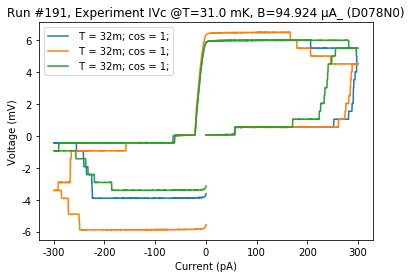

In [4]:
d078n0.plot({'T': 0.5, 'cos': 1})

# Meas

## Plan

- Check noise level again among different sources (at midF point)
- Check Stablility for high frustration
- Check N5 for single SQUID
- Check source-feedback-confusion effect by measuring the V for load resistor to recover real I

## 1/26

In [681]:
936+180


1116

<IPython.core.display.Javascript object>


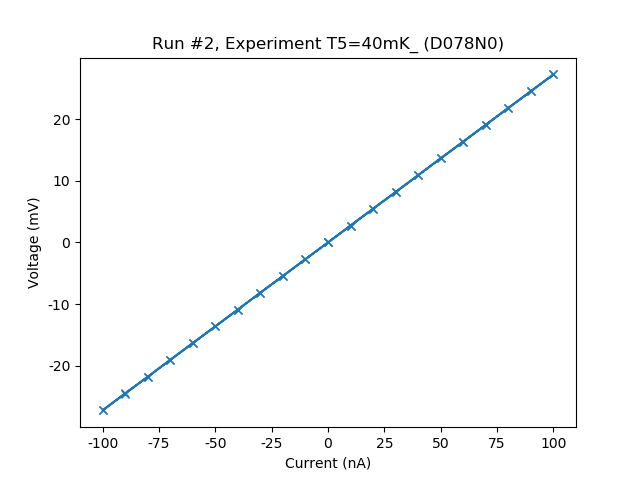

R_4pb = 272.5 kohm


In [564]:
plot_by_id(2, marker = 'x')
print('R_4pb = {}ohm'.format(si_format(np.polyfit(xy_by_id(2)[0],xy_by_id(2)[1],1)[0])))

<IPython.core.display.Javascript object>


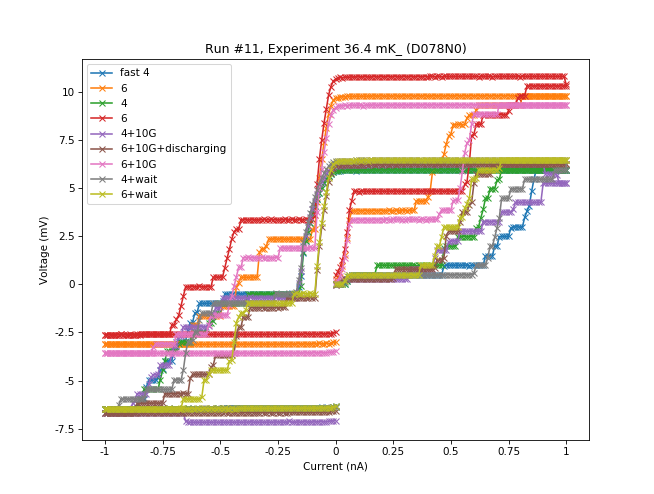

In [96]:
ls = 'fast 4','6','4','6','4+10G', '6+10G+discharging', '6+10G', '4+wait', '6+wait'


batch_plot_by_id(range(3,11+1),marker = 'x', labels = ls)#fast 4,6,4,6,4+10G, 6+10G+discharging, 6+10G, 4+wait, 6+wait



It seems that right after each scan there's charging resulting in a shift to Voffset to ~500mV (before preamp). Wait at least 1.5 min before next scan.

I'm not sure if this is just because the preamp is at low battery.

<IPython.core.display.Javascript object>


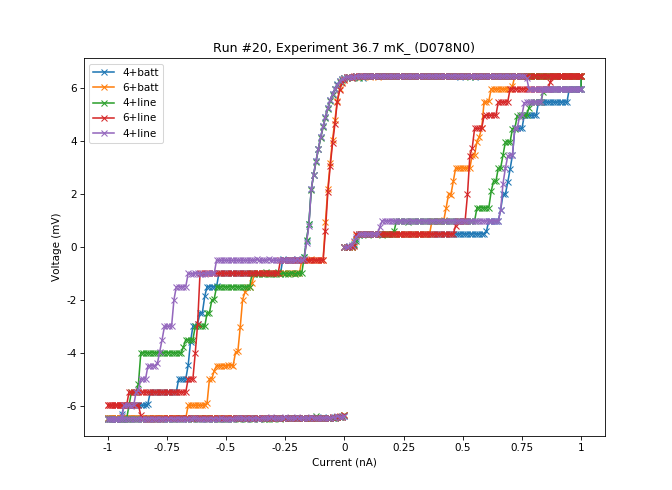

In [98]:
ls = '4+batt', '6+batt', '4+line', '6+line', '4+line'

batch_plot_by_id([10,11,14,18,20],marker = 'x', labels = ls) # 4+batt, 6+batt, 4+line, 6+line, 4+line, 

<IPython.core.display.Javascript object>


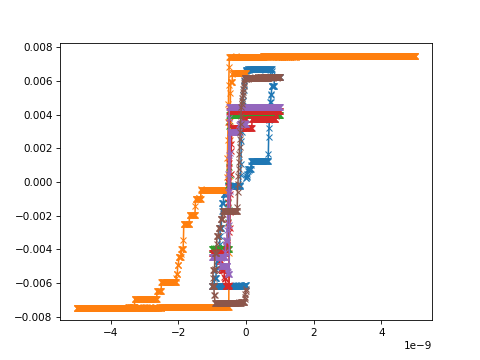

In [138]:
plt.close('all')
f,ax=plt.subplots()
for i in range(20,25+1):
    N = len(xy_by_id(i)[0])
    ax.plot(xy_by_id(i)[0],xy_by_id(i)[1]-(xy_by_id(i)[1][int(N/4)]+xy_by_id(i)[1][int(3*N/4)])/2, marker = 'x', ls = '-', label = 'IVc')

plt.show()

ideal gap size: 16 x 2xdelta = 16x0.495mV = 7.92mV
measured gap: 6.45mV
Duh! The switching continues... Set to larger range and measure again

Got 7.48mV, which means at most only one SQUID was shorted. (7.48+0.495 = 7.98mV), or there is slightly shift in gap due to Tc is slightly modified by thickness.

However there seems to be some offset current which triggered switching earlier for the forward sweeping.

> Charge battery and measure again tmr.

## 1/27

check reproducibility of switchws - several IVC at identical parameters: fast 4, line preamp, Keith

<IPython.core.display.Javascript object>


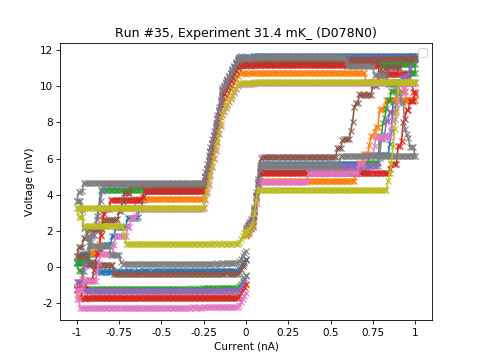

No handles with labels found to put in legend.


In [129]:
batch_plot_by_id(range(27, 35+1), marker = 'x')

Indeed, a drift. Why? Line preamp, no filters. But charging is obvious, there's not only drift, but hysterisys. Too high R of the sample itself? 

Same meas with 1s between points

<IPython.core.display.Javascript object>


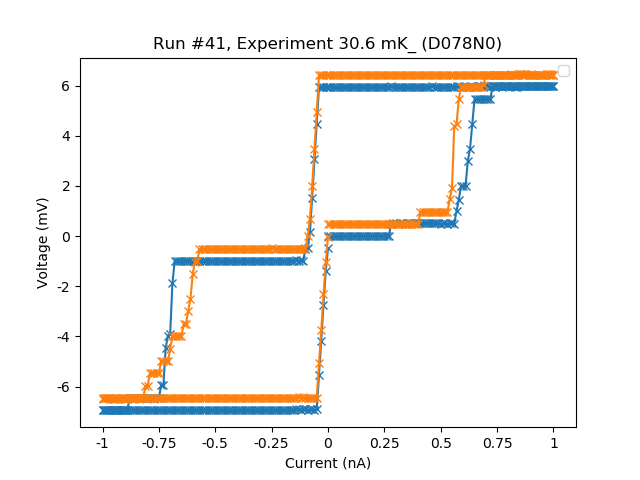

No handles with labels found to put in legend.


In [188]:
batch_plot_by_id(range(40, 41+1), marker = 'x')

The previous meas was done in 1uA range, which has min step 10pA.

reset the I_bias range to 10nA (min. step 1pA) and redo the time delay meas (from 0.1sec to 1sec)

<IPython.core.display.Javascript object>


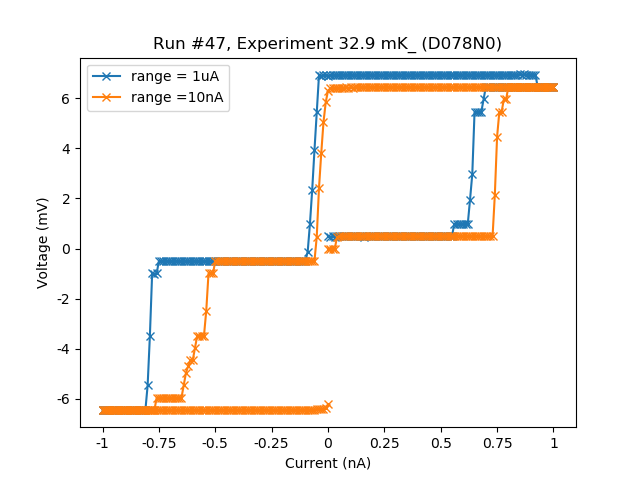

In [186]:
ls = ['range = 1uA', 'range =10nA']
batch_plot_by_id(range(46, 47+1), marker = 'x', labels = ls)

Many curves with 1sec btween pts

<IPython.core.display.Javascript object>


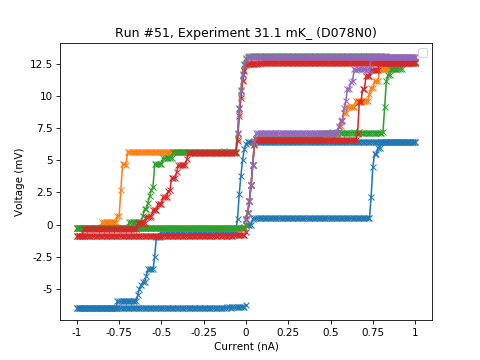

No handles with labels found to put in legend.


In [143]:
batch_plot_by_id(range(47, 51+1), marker = 'x')

Still charging. Change Vmeter Rload to 10GOhm (was 10MOhm before)

<IPython.core.display.Javascript object>


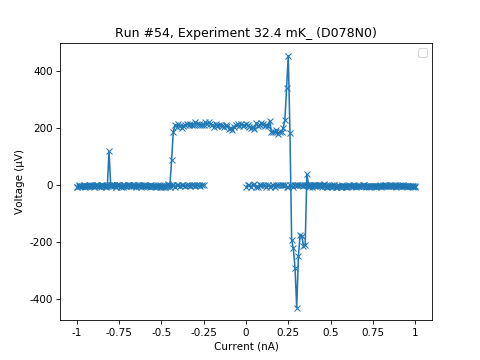

No handles with labels found to put in legend.


In [150]:
batch_plot_by_id(range(54, 54+1), marker = 'x')

^^ opend the box during the meas. level has been changed???

ground error - just touched outside box during the meas - level dropped down to 0

forgot to turn on Keith

repeat

<IPython.core.display.Javascript object>


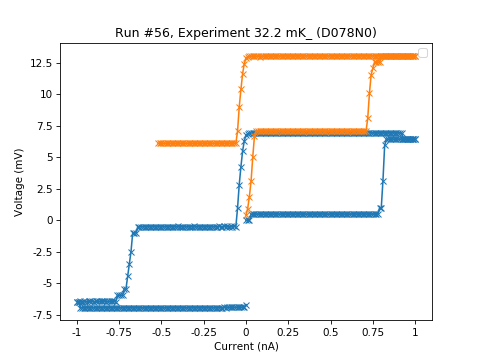

No handles with labels found to put in legend.


In [157]:
batch_plot_by_id(range(55, 56+1), marker = 'x')

The reason for the charging is still unknown, but this shift is due to mes_offset procedure. 

After the IVC udu junction is in gap state, so we measure wrong offset

Try AWG, .1 s

<IPython.core.display.Javascript object>


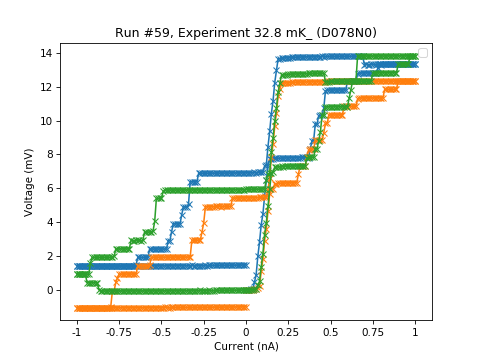

No handles with labels found to put in legend.


In [165]:
batch_plot_by_id(range(57, 59+1), marker = 'x')

Now it's the same without offset_meas line in the IVC_udu meas code.

<IPython.core.display.Javascript object>


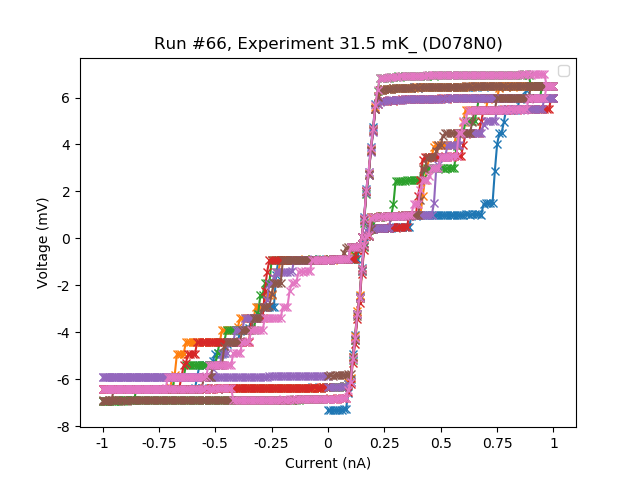

No handles with labels found to put in legend.


In [378]:
batch_plot_by_id(range(60, 66+1), marker = 'x')

better, i think. trying 1sec delay

anyway, awg gives some slope (needs more carefull analysis)

<IPython.core.display.Javascript object>


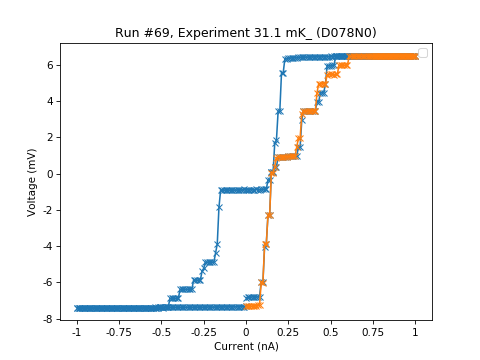

No handles with labels found to put in legend.


In [173]:
batch_plot_by_id(range(68, 69+1), marker = 'x')

Ok, awg has no charging issue, but there's noise-induced R0

go back to Keith 6220, try different triax settings (keep 1sec delay time, triax setting between float vs GND)

<IPython.core.display.Javascript object>


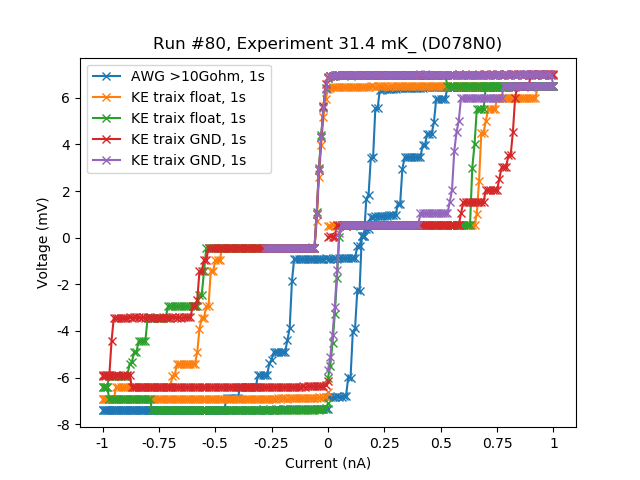

In [379]:
ls = ['AWG >10Gohm, 1s', 
      'KE traix float, 1s', 
      'KE traix float, 1s', 
      'KE traix GND, 1s',
      'KE traix GND, 1s']
batch_plot_by_id([68,70,71,79,80], marker = 'x', labels = ls)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


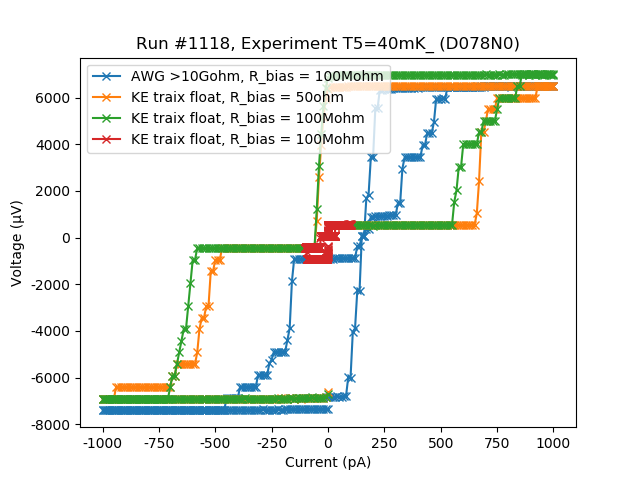

In [380]:
ls = ['AWG >10Gohm, R_bias = 100Mohm', 
      'KE traix float, R_bias = 50ohm', 
      'KE traix float, R_bias = 100Mohm',
      'KE traix float, R_bias = 100Mohm']
batch_plot_by_id([68,70,81,1118], marker = 'x', labels = ls)#82

It does not seem to be different between traix settings. Roll back to traix float.

ok, so in this "charging" issue we know these:
- Differences
 1. fast 4 or fast 6 setting for HP voltmeter
 2. delay time. Larger delay time has smaller charging effect ("overshooting" at retrapping scan)
 3. No dramatic charging on AWG, but we have such issue on KE6220
- No differences
 1. KE traix setting
 2. R_bias in KE biasing line

new source:

<IPython.core.display.Javascript object>


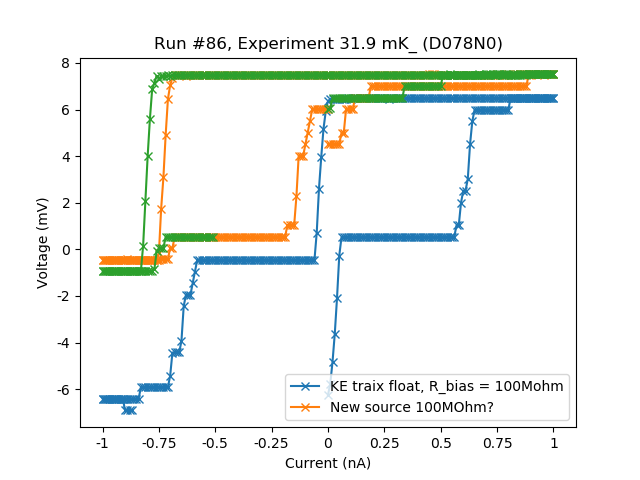

In [214]:
ls = [
      'KE traix float, R_bias = 100Mohm',
      'New source 100MOhm?',
        '']
batch_plot_by_id([82, 85, 86], marker = 'x', labels = ls)

even worse! looks like there's no enough negative current to switch, try higher range
also it's maybe bad setttings - still 'filter mode on', disable and meas for 5nA


<IPython.core.display.Javascript object>


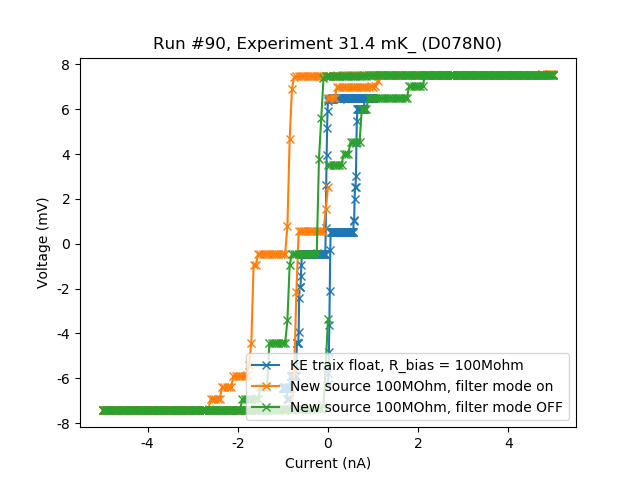

In [235]:
ls = [
      'KE traix float, R_bias = 100Mohm',
#       'New source 100MOhm, filter mode on',
        'New source 100MOhm, filter mode on',
 'New source 100MOhm, filter mode OFF']
batch_plot_by_id([82,  88, 90], marker = 'x', labels = ls)

yea, filtering setting changes time constant a lot. But there's still charging effect, closer look at 1 nA span

<IPython.core.display.Javascript object>


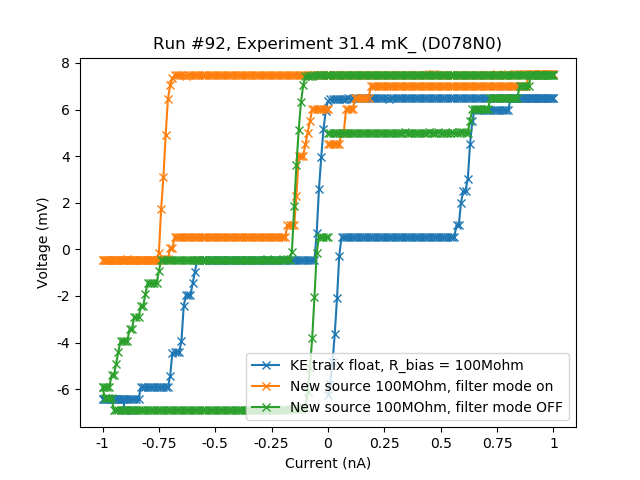

In [240]:
ls = [
      'KE traix float, R_bias = 100Mohm',
#       'New source 100MOhm, filter mode on',
        'New source 100MOhm, filter mode on',
 'New source 100MOhm, filter mode OFF']
batch_plot_by_id([82,  85, 92], marker = 'x', labels = ls)

comparable with Keith, maybe some offset


figuring out which part of the circuit is responsible for this charging - connect dummy 100kOhm on the top

<IPython.core.display.Javascript object>


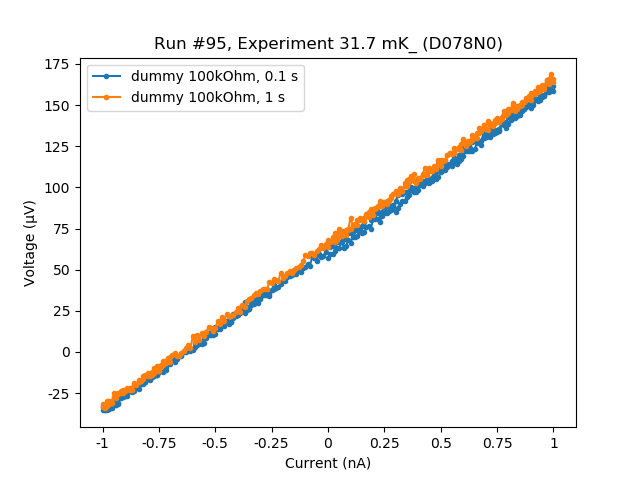

In [345]:
ls = [
    'dummy 100kOhm, 0.1 s',
    'dummy 100kOhm, 1 s',
    ]
batch_plot_by_id([94, 95], marker = '.', labels = ls)

looks good. let's measure normal branch and try to see histerysis there.

measure 50nA span IVC, for Newsource, Keith

<IPython.core.display.Javascript object>


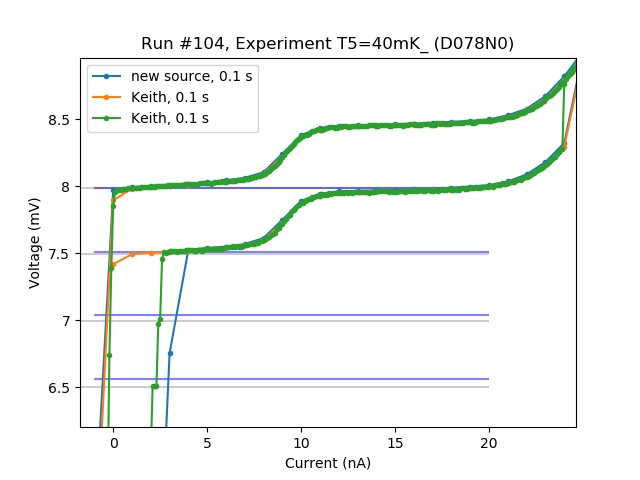

In [199]:
fig, ax = plt.subplots()

gap = 495e-6
offset = 68e-6
fr = 20e-6
N = 16

for i in range(-N,N+1,1):
    ax.hlines(i*gap  +offset,                   -20e-9,20e-9,
              alpha = 0.2)

#     ax.hlines( gap*(N*(2*i+1)/(2*N+1)) +offset, -1e-9,1e-9,
#               alpha = 0.1, color='r')

    if i == 0:
        ax.hlines( offset + fr*N, -1e-9,20e-9,
                       alpha = 0.5, color='b')
        ax.hlines( offset - fr*N, -1e-9,20e-9,
                       alpha = 0.5, color='b')
    else:
        k = np.sign(i)*(N - abs(i))
        ax.hlines( offset + gap*i + fr*k, -1e-9,20e-9,
                       alpha = 0.5, color='b')  
        
ls = ['new source, 0.1 s',
      'Keith, 0.1 s',
      'Keith, 0.1 s']
batch_plot_by_id([98,  100, 104], ax = ax, marker = '.', labels = ls)

go to R state, set I to 0, wait there - measure decay

<IPython.core.display.Javascript object>


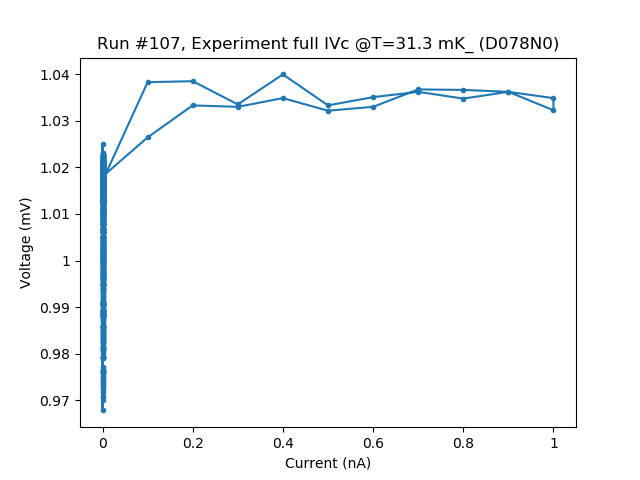

([<matplotlib.axes._subplots.AxesSubplot at 0x13eb8fb0>], [None])

In [265]:
plot_by_id(107, marker = '.')

V doesnt decay even if we wait long time at I = 0, but drops immideately if we disconnect the source

decrease I range down to 1nA and repeat

<IPython.core.display.Javascript object>


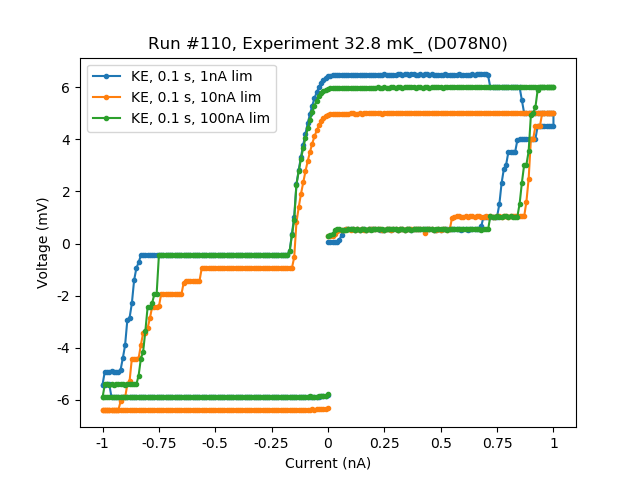

In [271]:
ls = [
      'KE, 0.1 s, 1nA lim',

    'KE, 0.1 s, 10nA lim',
'KE, 0.1 s, 100nA lim']
batch_plot_by_id([108,  109, 110], marker = '.', labels = ls)

Check again the dummy resistance, are we expecting to see such charging through traix setting? (0.2nA supposed to be large enough to see any differences)

<IPython.core.display.Javascript object>


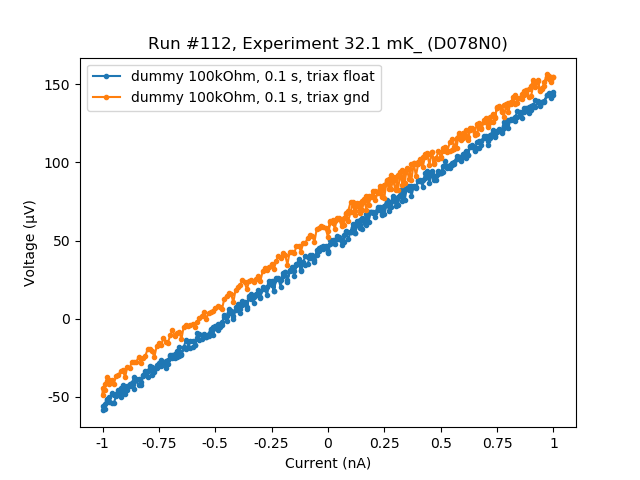

In [273]:
ls = [
    'dummy 100kOhm, 0.1 s, triax float',
    'dummy 100kOhm, 0.1 s, triax gnd'
    ]
batch_plot_by_id([111, 112], marker = '.', labels = ls)

### About the hystersis at retrapping loop

The working hyposysis is the KE6220 was confused by its internal voltage feedback loop regarding the gapped voltage at the retrapping scan, and then it supplied with incorrect value of I_bias. This could explain:
1. Source dependency: AWG doesn't have feedback loop so there's no confusion for AWG. (run id 68,70)
2. The direction of delay could be explained by this as well.
3. Such hystersis was also absent when the DUT has passive response (either the SC branch, normal branch, or even just dummy resistor) (run id 74, 112)
4. The voltage state is not discharging if wait for sufficiantly long time. (run id 107)

<IPython.core.display.Javascript object>


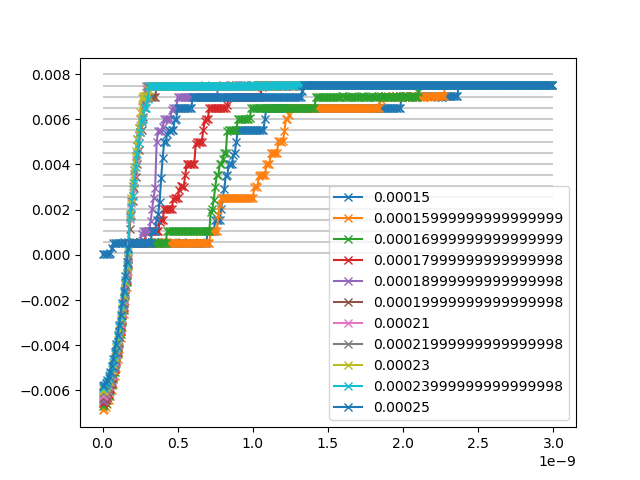

In [50]:
plt.close('all')
f,ax=plt.subplots()
l = int(len(xy_by_id(146)[0])/4)
lbl = np.linspace(150e-6,270e-6,13)
for i,v in enumerate(range(146,156+1)):
    ax.plot(xy_by_id(v)[0][:l],xy_by_id(v)[1][:l], 
            marker = 'x', ls = '-', label = str(lbl[i]))
for i in range (17):
    ax.hlines(i*495e-6+65e-6, 0,3e-9, alpha = 0.2)
ax.legend()
plt.show()

ok, it looks like the FF is around (120e-6+300e-6)/2 ~ 210e-6 (id 150, 156)

<IPython.core.display.Javascript object>


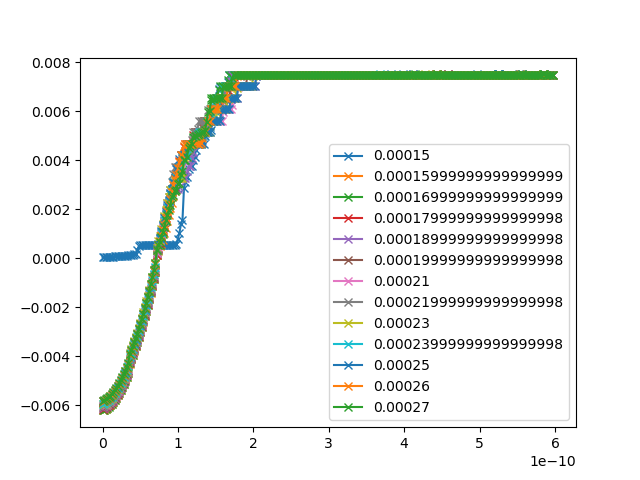

In [328]:
plt.close('all')
f,ax=plt.subplots()
l = int(len(xy_by_id(157)[0])/4)
lbl = np.linspace(150e-6,270e-6,13) 
for i,v in enumerate(range(157,169+1)):
    ax.plot(xy_by_id(v)[0][:l],xy_by_id(v)[1][:l], 
            marker = 'x', ls = '-', label = str(lbl[i]))

# l = int(len(xy_by_id(151)[0])/4)
# ax.plot(xy_by_id(151)[0][:l],xy_by_id(151)[1][:l], 
#         marker = 'o', ls = '-', label = '150e-6')
ax.legend()
plt.show()

again, the source-feedback-confusion effect is screwing up the zero bias branch. (only the blue branch which is the first scan shows meaningful IVc.) Set time.sleep(120) in between measurements.

Be careful about any IVc that starts with -0.006V, since it's highly likely that such curve was screwed up. (see next plot) It's not fair to make such a comparison between I_bias steps since the measurement was begun in a different state. (The relaxation time prior to each scan was undefined.)

<IPython.core.display.Javascript object>


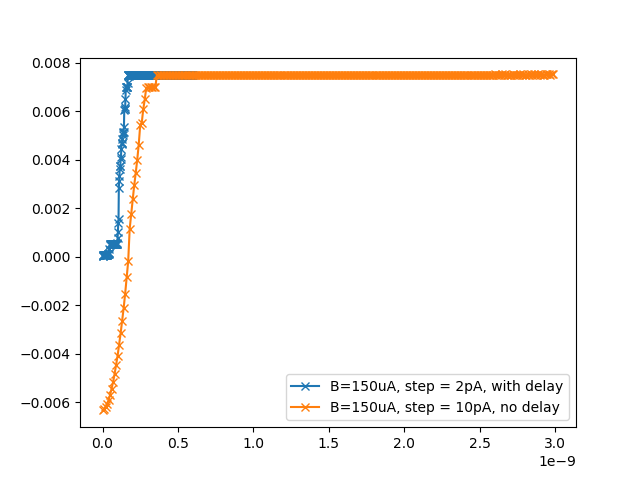

In [343]:
plt.close('all')
f,ax=plt.subplots()
l = [int(len(xy_by_id(157)[0])/4), int(len(xy_by_id(151)[0])/4)]
lbl =['B=150uA, step = 2pA, with delay','B=150uA, step = 10pA, no delay']
for i,v in enumerate([157, 151]):
    ax.plot(xy_by_id(v)[0][:l[i]],xy_by_id(v)[1][:l[i]], 
            marker = 'x', ls = '-', label = str(lbl[i]))
ax.legend()
plt.show()

## 1/28

I was planning to do 55loops with the rate about 4curves/hr, but for some reasons some of the scans took 2..4 times longer than others.

<IPython.core.display.Javascript object>


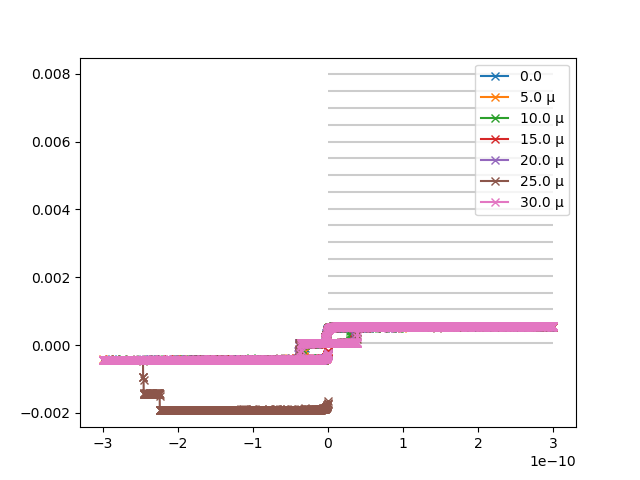

In [39]:
plt.close('all')
f,ax=plt.subplots()
l = int(len(xy_by_id(172)[0])/4)
lbl = np.linspace(0e-6,270e-6,55)[0:7]
for i,v in enumerate(range(172,205+1)[0:7]):
    ax.plot(xy_by_id(v)[0][:],xy_by_id(v)[1][:], 
            marker = 'x', ls = '-', label = si_format(lbl[i]))
for i in range (17):
    ax.hlines(i*495e-6+65e-6, 0,.3e-9, alpha = 0.2)

# ax.set_xlim(-5e-12,85e-12)
# ax.set_ylim( 0e-6 ,0.6e-3)
ax.legend()
plt.show()

<IPython.core.display.Javascript object>


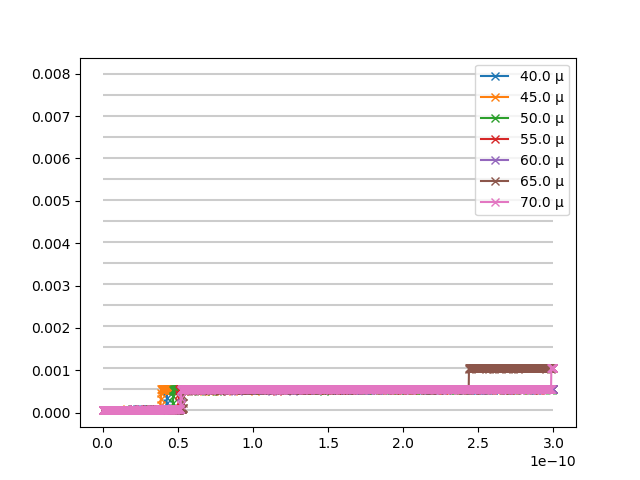

In [659]:
plt.close('all')
f,ax=plt.subplots()
l = int(len(xy_by_id(172)[0])/4)
lbl = np.linspace(0e-6,270e-6,55)[8:15]
for i,v in enumerate(range(172,205+1)[8:15]):
    ax.plot(xy_by_id(v)[0][:l],xy_by_id(v)[1][:l], 
            marker = 'x', ls = '-', label = si_format(lbl[i]))
for i in range (17):
    ax.hlines(i*495e-6+65e-6, 0,.3e-9, alpha = 0.2)
# ax.set_xlim(-5e-12,85e-12)
# ax.set_ylim( 0e-6 ,0.6e-3)
ax.legend()
plt.show()

<IPython.core.display.Javascript object>


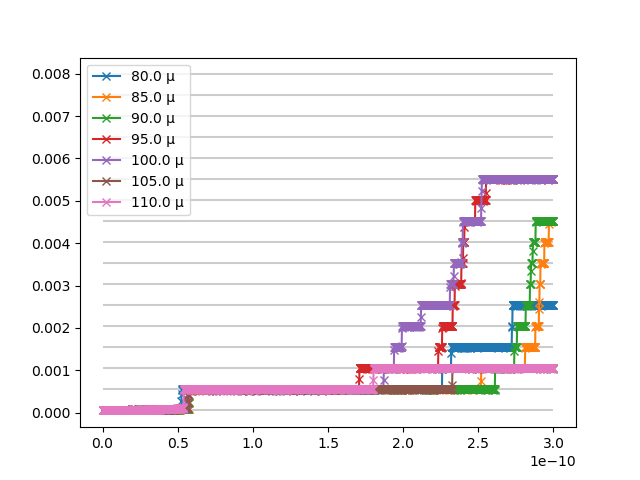

In [658]:
plt.close('all')
f,ax=plt.subplots()
l = int(len(xy_by_id(172)[0])/4)
lbl = np.linspace(0e-6,270e-6,55)[16:23]
for i,v in enumerate(range(172,207+1)[16:23]):
    ax.plot(xy_by_id(v)[0][:l],xy_by_id(v)[1][:l], 
            marker = 'x', ls = '-', label = si_format(lbl[i]))  
for i in range (17):
    ax.hlines(i*495e-6+65e-6, 0,.3e-9, alpha = 0.2) 
# ax.set_xlim(-5e-12,85e-12)
# ax.set_ylim( 0e-6 ,0.6e-3)
ax.legend()
plt.show()

<IPython.core.display.Javascript object>


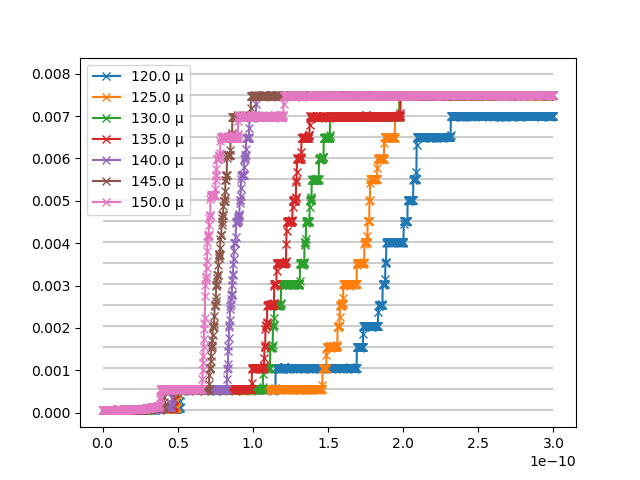

In [656]:
plt.close('all')
f,ax=plt.subplots()
l = int(len(xy_by_id(172)[0])/4)
lbl = np.linspace(0e-6,270e-6,55)[24:31]
for i,v in enumerate(range(172,207+1)[24:31]):
    ax.plot(xy_by_id(v)[0][:l],xy_by_id(v)[1][:l], 
            marker = 'x', ls = '-', label = si_format(lbl[i]))
for i in range (17):
    ax.hlines(i*495e-6+65e-6, 0,.3e-9, alpha = 0.2)
# ax.set_xlim(-5e-12,85e-12)
# ax.set_ylim( 0e-6 ,0.6e-3)
ax.legend()
plt.show()

<IPython.core.display.Javascript object>


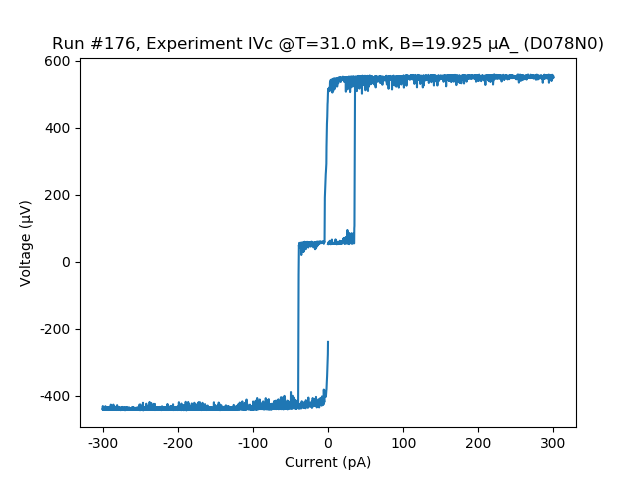

([<matplotlib.axes._subplots.AxesSubplot at 0x102104d0>], [None])

In [668]:
plot_by_id(176)

<IPython.core.display.Javascript object>


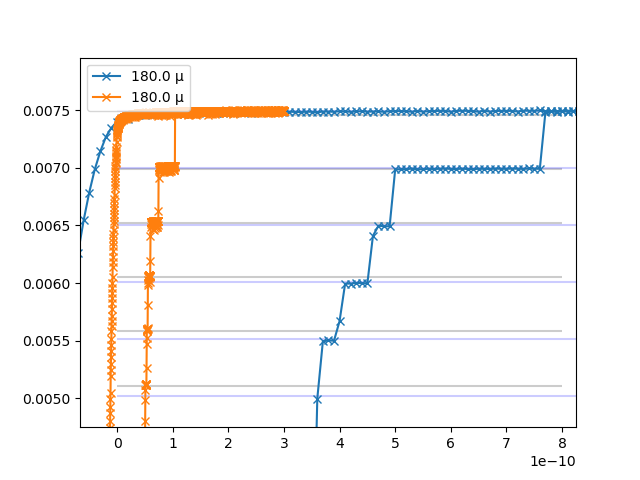

In [672]:
plt.close('all')
f,ax=plt.subplots()
# l = int(len(xy_by_id(172)[0])/4)
lbl = np.linspace(180e-6,180e-6,55)[32:39]
for i,v in enumerate([150,204]):
    ax.plot(xy_by_id(v)[0][:],xy_by_id(v)[1][:], 
            marker = 'x', ls = '-', label = si_format(lbl[i])) 
for i in range (17):
    ax.hlines(i*470e-6-60e-6, 0,0.8e-9, alpha = 0.2)  
for i in range (17):
    ax.hlines(i*495e-6+65e-6, 0,3e-9, alpha = 0.2, color = 'b')
# ax.set_xlim(-5e-12,85e-12)
# ax.set_ylim( 0e-6 ,0.6e-3)
ax.legend()
plt.show() 

<IPython.core.display.Javascript object>


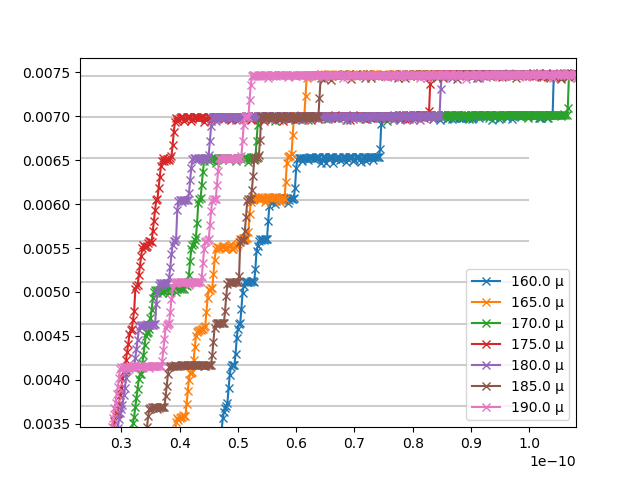

In [663]:
plt.close('all')
f,ax=plt.subplots()
l = int(len(xy_by_id(172)[0])/4)
lbl = np.linspace(0e-6,270e-6,55)[32:39]
for i,v in enumerate(range(172,212+1)[32:39]):
    ax.plot(xy_by_id(v)[0][:l],xy_by_id(v)[1][:l], 
            marker = 'x', ls = '-', label = si_format(lbl[i])) 
for i in range (17):
    ax.hlines(i*470e-6-60e-6, 0,0.1e-9, alpha = 0.2)  
# ax.set_xlim(-5e-12,85e-12)
# ax.set_ylim( 0e-6 ,0.6e-3)
ax.legend()
plt.show() 

<IPython.core.display.Javascript object>


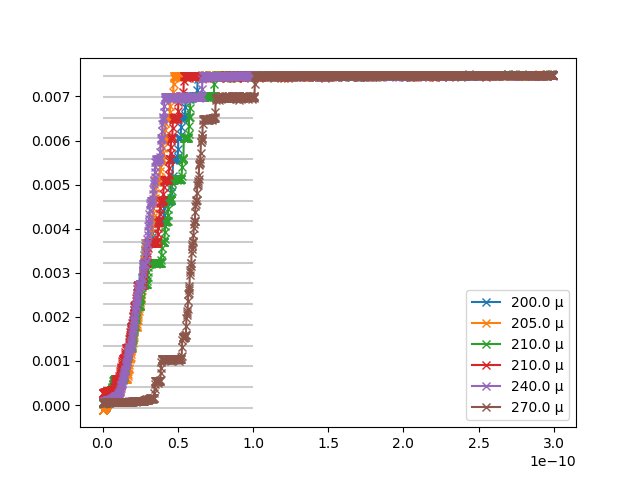

In [635]:
plt.close('all')
f,ax=plt.subplots()
l = int(len(xy_by_id(172)[0])/4)
lbl = [200e-6,205e-6,210e-6,210e-6,240e-6,270e-6]
for i,v in enumerate([212,213,214,216,217,218]):
    ax.plot(xy_by_id(v)[0][:l],xy_by_id(v)[1][:l], 
            marker = 'x', ls = '-', label = si_format(lbl[i]))  
for i in range (17):
    ax.hlines(i*470e-6-60e-6, 0,0.1e-9, alpha = 0.2) 

ax.set_xlim(-5e-12,85e-12)
ax.set_ylim(-.2e-3,0.6e-3)
ax.legend()
plt.show()

In [513]:
exps78N0_pd['ids'][2][:3]

range(219, 222)

<IPython.core.display.Javascript object>


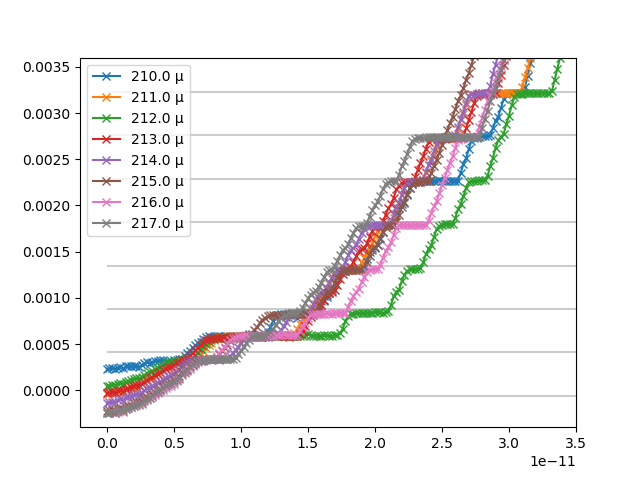

In [633]:
plt.close('all')
f,ax=plt.subplots()

lbl = exps78N0_pd['B'][2][0:7+1]
l = int(len(xy_by_id(219)[0])/4)
for i,v in enumerate(exps78N0_pd['ids'][2][0:7+1]):
    ax.plot(xy_by_id(v)[0][:l],xy_by_id(v)[1][:l], 
            marker = 'x', ls = '-', label = si_format(lbl[i])) 
for i in range (17):
    ax.hlines(i*470e-6-60e-6, 0,0.1e-9, alpha = 0.2)

ax.set_xlim(-2e-12,35e-12)
ax.set_ylim(-.4e-3,3.6e-3)
ax.legend()
plt.show()

<IPython.core.display.Javascript object>


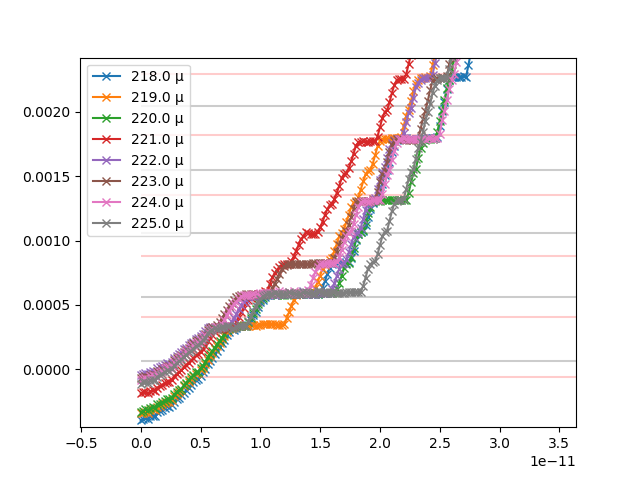

In [759]:
plt.close('all')
f,ax=plt.subplots()

lbl = exps78N0_pd['B'][2][8:15+1]
l = int(len(xy_by_id(219)[0])/4)
for i,v in enumerate(exps78N0_pd['ids'][2][8:15+1]):
    ax.plot(xy_by_id(v)[0][:l],xy_by_id(v)[1][:l], 
            marker = 'x', ls = '-', label = si_format(lbl[i])) 
for i in range (17):
    ax.hlines(i*470e-6-60e-6, 0,0.1e-9, alpha = 0.2, color = 'r')
    
for i in range (17):
    ax.hlines(i*495e-6+65e-6, 0,0.1e-9, alpha = 0.2)    

# ax.set_xlim(-5e-12,85e-12)
# ax.set_ylim(-.2e-3,0.6e-3)
ax.legend()
plt.show()

Judging from the size the I_sw, I would say that ZF is at about 90uA. But why it is shifted so much? (Previous cooldown we saw ZF=4uA and FF = 224uA)

It seems that there's some rising part at SC branch when the IVc is about to switch. It is important to define where should we consider as "zero-bias". (maybe I_bias <10pA?)

Hmmm, the FF is still between 210..240uA, maybe we were looking at the wrong plateau? Check data again.
> rememebr that Isrc.I in these measurement were set to Isrc.I = i, it wasn't shifted.

<IPython.core.display.Javascript object>


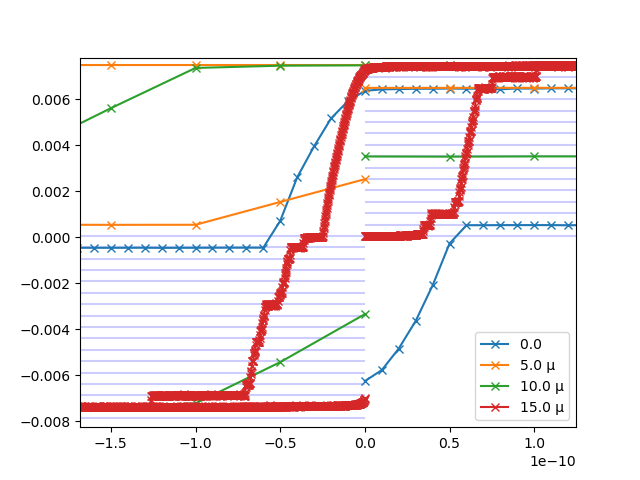

In [707]:
plt.close('all')
f,ax=plt.subplots()
for i,v in enumerate([82,88,90,218]):
    ax.plot(xy_by_id(v)[0],xy_by_id(v)[1], 
            marker = 'x', ls = '-', label = si_format(lbl[i]))   
# ax.set_xlim(-5e-12,85e-12)
# ax.set_ylim(-.2e-3,0.6e-3)

# for i in range (17):
#     ax.hlines( i*470e-6-60e-6, 0,3e-9, alpha = 0.2)
# for i in range (17):
#     ax.hlines(-i*470e-6-60e-6, 0,3e-9, alpha = 0.2)
for i in range (17):
    ax.hlines(i*495e-6+65e-6, 0,3e-9, alpha = 0.2, color = 'b')
    ax.hlines(-i*495e-6+65e-6, 0,-3e-9, alpha = 0.2, color = 'b')

ax.legend()
plt.show()

<IPython.core.display.Javascript object>


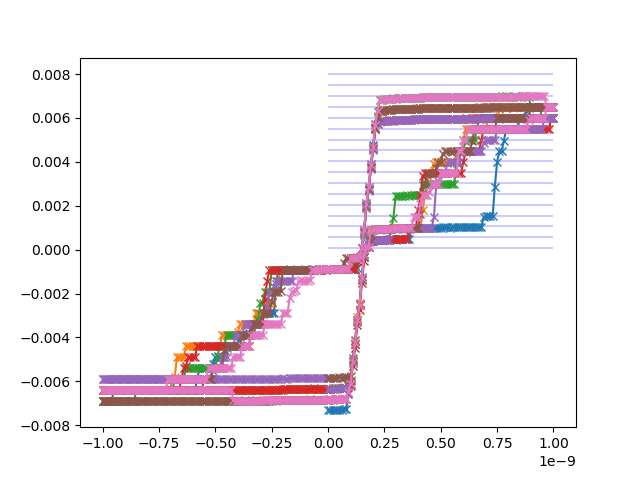

In [678]:
plt.close('all')
f,ax=plt.subplots()
l = int(len(xy_by_id(60)[0])/4)
lbl = np.linspace(0e-6,270e-6,55)
for i,v in enumerate(range(60,66+1)):
    ax.plot(xy_by_id(v)[0][:],xy_by_id(v)[1][:], 
            marker = 'x', ls = '-', label = si_format(lbl[i]))   
# ax.set_xlim(-5e-12,85e-12)
# ax.set_ylim( 0e-6 ,0.6e-3)
# ax.legend()

# for i in range (17):
#     ax.hlines(i*470e-6-60e-6, 0,1e-9, alpha = 0.2)
for i in range (17):
    ax.hlines(i*495e-6+65e-6, 0,1e-9, alpha = 0.2, color = 'b')

plt.show() 

<IPython.core.display.Javascript object>


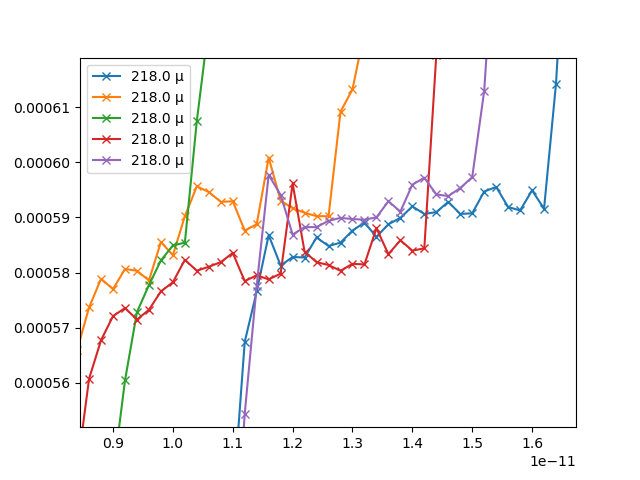

In [694]:
plt.close('all')
f,ax=plt.subplots()

lbl = np.full_like(np.arange(10), 218e-6, dtype=float)
l = int(len(xy_by_id(219)[0])/4)
for i,v in enumerate(exps78N0_pd['ids'][3]):
    ax.plot(xy_by_id(v)[0][:l],xy_by_id(v)[1][:l], 
            marker = 'x', ls = '-', label = si_format(lbl[i])) 
for i in range (17):
    ax.hlines(i*470e-6-60e-6, 0,0.1e-9, alpha = 0.2)

# ax.set_xlim(-5e-12,85e-12)
# ax.set_ylim(-.2e-3,0.6e-3)
ax.legend()
plt.show()

## 1/29


CHeck if we have continious sc branch. it's fast 4, should repeat with fast 6

<IPython.core.display.Javascript object>


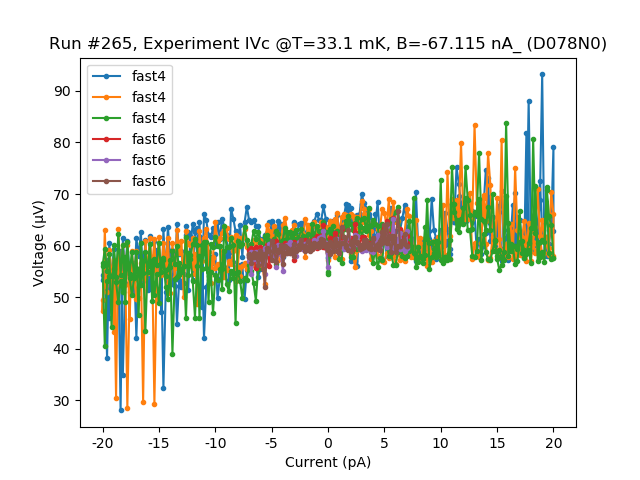

In [691]:
batch_plot_by_id([256,257,258,263,264, 265], marker = '.', 
                 labels = ['fast4']*3+['fast6']*3)

<IPython.core.display.Javascript object>


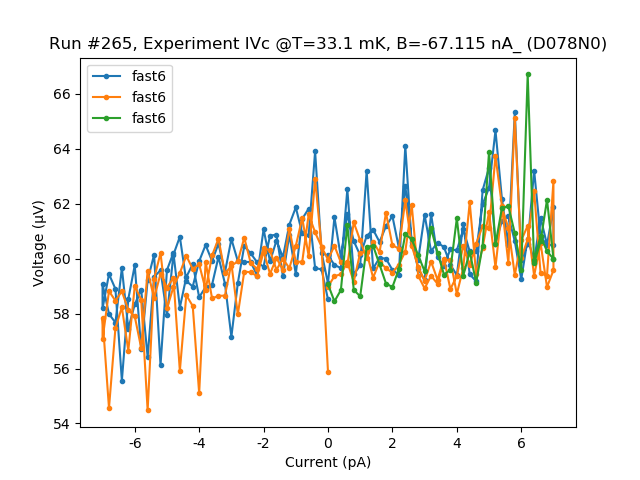

In [595]:
batch_plot_by_id([263,264, 265], marker = '.', labels = ['fast6']*3)

fast 6 fof ZF and FF to check the resistance on the stepsb

<IPython.core.display.Javascript object>


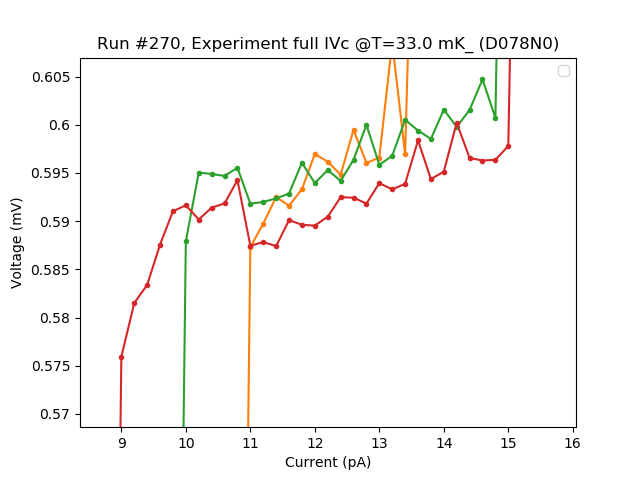

No handles with labels found to put in legend.


In [605]:
batch_plot_by_id([260, 261, 266, 268, 270], marker = '.')

trying to set up overnight repeativlive meas

<IPython.core.display.Javascript object>


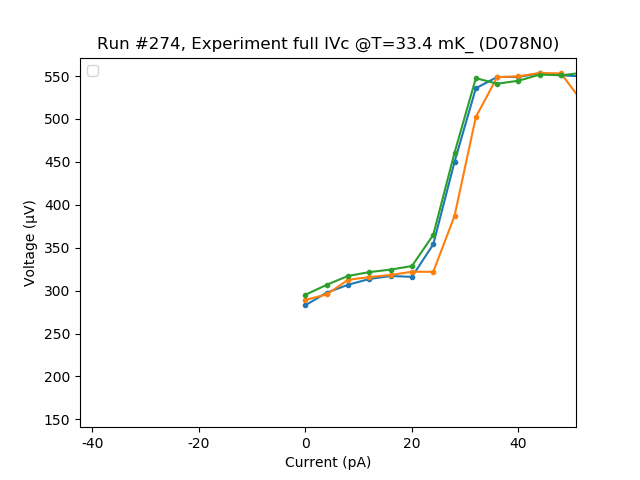

No handles with labels found to put in legend.


In [614]:
batch_plot_by_id([271,273, 274], marker = '.')

Repeative measurement of IVc at B = 0 ( cos = ??)

In [49]:
7.516/495.5

0.015168516649848638

<IPython.core.display.Javascript object>


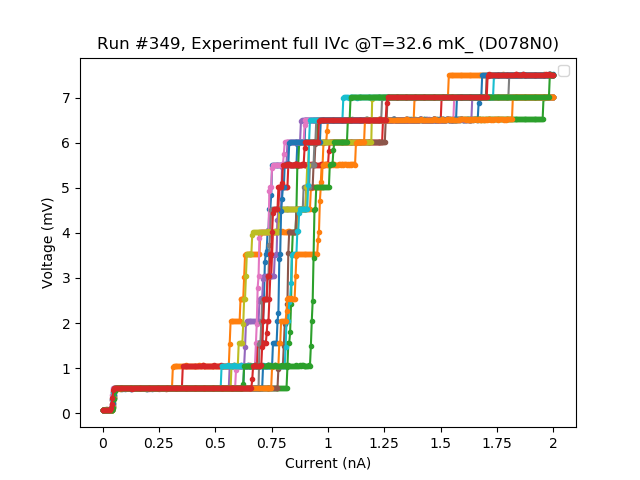

No handles with labels found to put in legend.


In [47]:
batch_plot_by_id(range(336,350), marker = '.' ,ls ='-')

## 1/30

fine scan fast 6

<IPython.core.display.Javascript object>


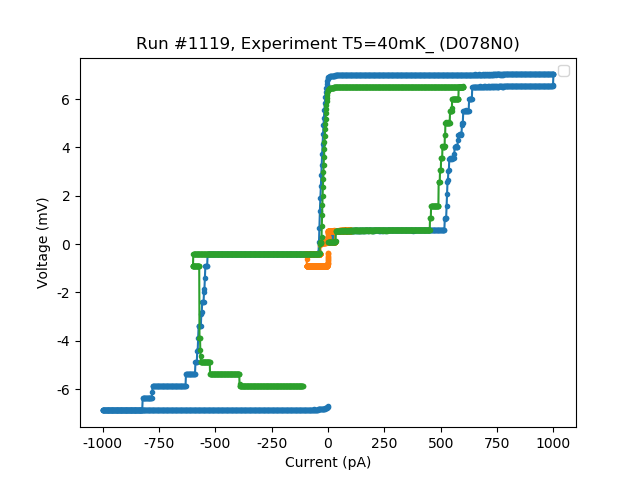

No handles with labels found to put in legend.


In [717]:
batch_plot_by_id([1117, 1118, 1119], marker = '.' ,ls ='-')

Ic0 ~ 50 pA
No slope anywhere

Turn on B = 270 and check R0

<IPython.core.display.Javascript object>


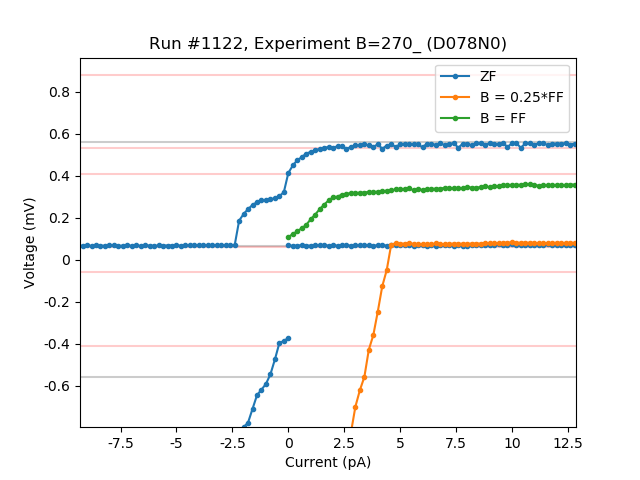

In [786]:
fig, ax = plt.subplots()

labs = 'ZF', 'B = 0.25*FF', 'B = FF'

batch_plot_by_id([ 1118, 1120, 1122], ax = ax, marker = '.' ,ls ='-', 
                 labels = labs)

for i in range (0,17,1):
    ax.hlines(i*495e-6+65e-6, -.1e-9,.1e-9, alpha = 0.2)
for i in range (0,17,1):
    ax.hlines(i*470e-6-60e-6, -.1e-9,.1e-9, alpha = 0.2, color='r')
    
for i in range (-17,0,1):
    ax.hlines(i*493e-6-65e-6, -.1e-9,.1e-9, alpha = 0.2)
for i in range (-17,17,1):
    ax.hlines(i*470e-6+60e-6, -.1e-9,.1e-9, alpha = 0.2, color='r')

B = 270 causes finite R0 ~ 1MOhm on the 0th step, but the first one is in sc state! Also new swithching current is higher than it was for B = 0.

Repeat for FF = 218

steps are misaligned  for FF and FF/4? different gap? try to meas smaller I range

<IPython.core.display.Javascript object>


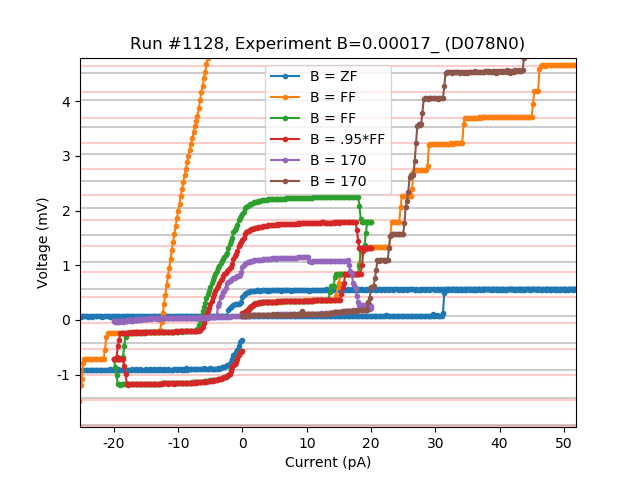

In [757]:
fig, ax = plt.subplots()

labs = 'B = ZF', 'B = FF', 'B = FF', 'B = .95*FF', 'B = 170', 'B = 170'

batch_plot_by_id([  1118, 1122, 1123, 1124, 1126, 1128], ax = ax, marker = '.' ,ls ='-', 
                 labels = labs)

for i in range (-17,17,1):
    ax.hlines(i*495e-6+65e-6, -.1e-9,.1e-9, alpha = 0.2)
for i in range (-17,17,1):
    ax.hlines(i*470e-6-60e-6, -.1e-9,.1e-9, alpha = 0.2, color='r')

two sets of periodicity??

<IPython.core.display.Javascript object>


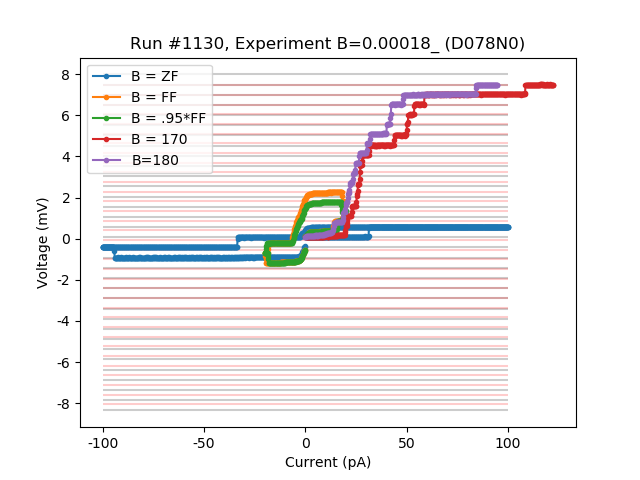

In [763]:
fig, ax = plt.subplots()

labs = 'B = ZF',  'B = FF', 'B = .95*FF',  'B = 170', 'B=180'

batch_plot_by_id([  1118,  1123, 1124,  1128, 1130], ax = ax, marker = '.' ,ls ='-', 
                 labels = labs)

for i in range (-17,17,1):
    ax.hlines(i*495e-6+65e-6, -.1e-9,.1e-9, alpha = 0.2)
for i in range (-17,17,1):
    ax.hlines(i*470e-6-60e-6, -.1e-9,.1e-9, alpha = 0.2, color='r')

transition happens between 170 and 180

<IPython.core.display.Javascript object>


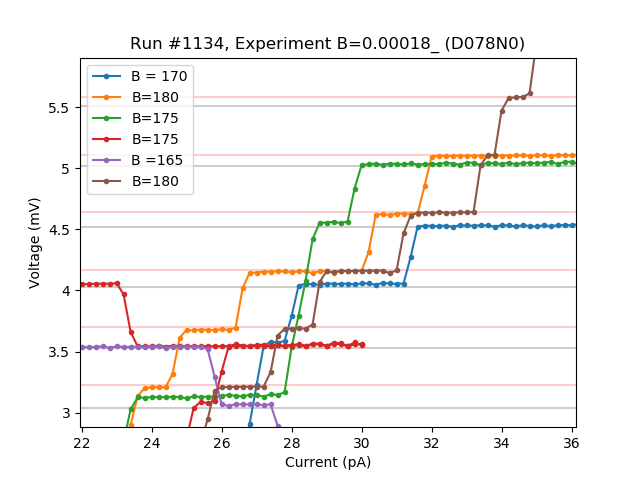

In [781]:
fig, ax = plt.subplots()

labs =   'B = 170', 'B=180',  'B=175', 'B=175' ,'B =165', 'B=180'

batch_plot_by_id([    1128, 1130, 1131, 1132, 1133, 1134], ax = ax, marker = '.' ,ls ='-', 
                 labels = labs)

for i in range (0,17,1):
    ax.hlines(i*495e-6+65e-6, 0,.1e-9, alpha = 0.2)
for i in range (0,17,1):
    ax.hlines(i*470e-6-60e-6, 0,.1e-9, alpha = 0.2, color='r')

<IPython.core.display.Javascript object>


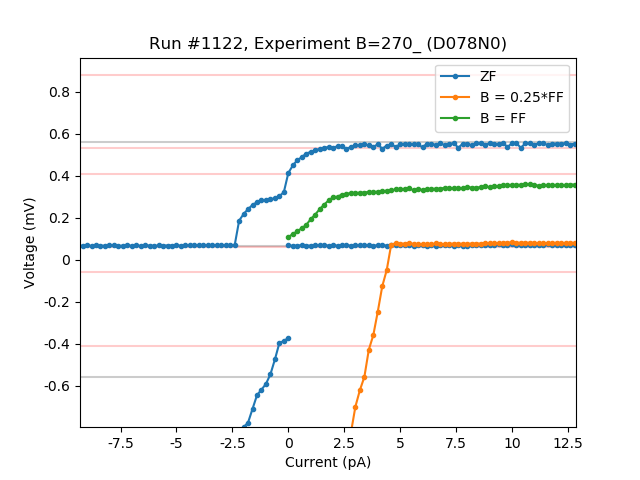

In [786]:
fig, ax = plt.subplots()

labs = 'ZF', 'B = 0.25*FF', 'B = FF'

batch_plot_by_id([ 1118, 1120, 1122], ax = ax, marker = '.' ,ls ='-', 
                 labels = labs)

for i in range (0,17,1):
    ax.hlines(i*495e-6+65e-6, -.1e-9,.1e-9, alpha = 0.2)
for i in range (0,17,1):
    ax.hlines(i*470e-6-60e-6, -.1e-9,.1e-9, alpha = 0.2, color='r')
    
for i in range (-17,0,1):
    ax.hlines(i*493e-6-65e-6, -.1e-9,.1e-9, alpha = 0.2)
for i in range (-17,17,1):
    ax.hlines(i*470e-6+60e-6, -.1e-9,.1e-9, alpha = 0.2, color='r')

<IPython.core.display.Javascript object>


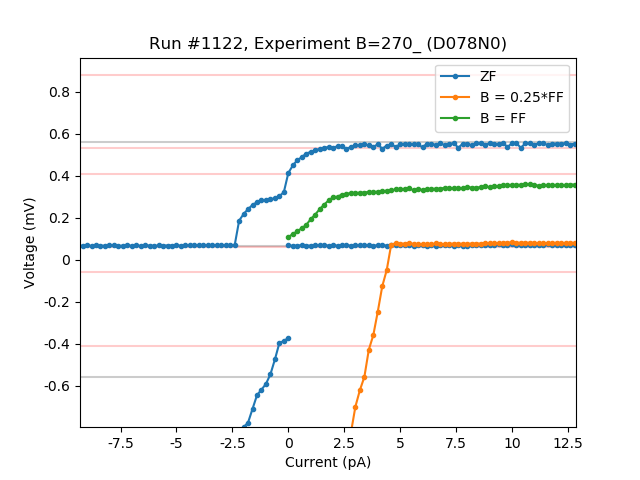

In [786]:
fig, ax = plt.subplots()

labs = 'ZF', 'B = 0.25*FF', 'B = FF'

batch_plot_by_id([ 1118, 1120, 1122], ax = ax, marker = '.' ,ls ='-', 
                 labels = labs)

for i in range (0,17,1):
    ax.hlines(i*495e-6+65e-6, -.1e-9,.1e-9, alpha = 0.2)
for i in range (0,17,1):
    ax.hlines(i*470e-6-60e-6, -.1e-9,.1e-9, alpha = 0.2, color='r')
    
for i in range (-17,0,1):
    ax.hlines(i*493e-6-65e-6, -.1e-9,.1e-9, alpha = 0.2)
for i in range (-17,17,1):
    ax.hlines(i*470e-6+60e-6, -.1e-9,.1e-9, alpha = 0.2, color='r')

<IPython.core.display.Javascript object>


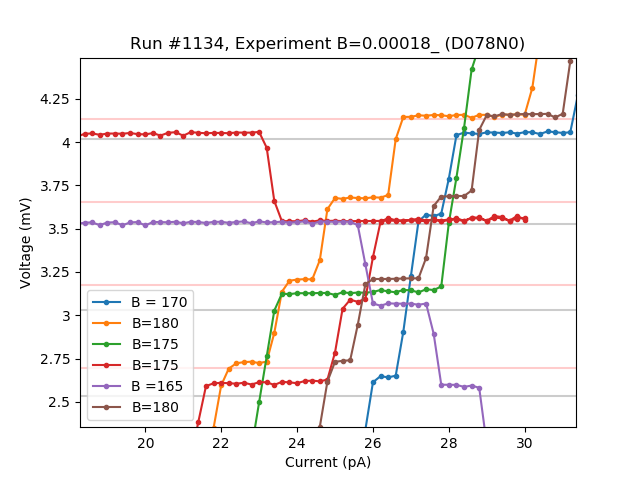

In [787]:
fig, ax = plt.subplots()

labs =   'B = 170', 'B=180',  'B=175', 'B=175' ,'B =165', 'B=180'

batch_plot_by_id([    1128, 1130, 1131, 1132, 1133, 1134], ax = ax, marker = '.' ,ls ='-', 
                 labels = labs)

for i in range(-16,16,1):
    ax.hlines(i*495e-6 +60e-6, -.3e-9,0.3e-9, alpha = 0.2)
    ax.hlines(15*495e-6 +60e-6 - (i+16)*495e-6*30/31, -.3e-9,0.3e-9, alpha = 0.2, color='r')


## 1/31

can describe the whole set of lines (both polarities, ZF and FF) by simple formula

1. remove offset 60e-6

2. fill the gap between +15 delta and -15 delta by 30 lines, it gives delta = 495 uV, it corresponds to ZF steps

3. fill the same gap with 31 line with width 495*30/31, it gives FF steps

it works fine  , see below, but wtf???

<IPython.core.display.Javascript object>


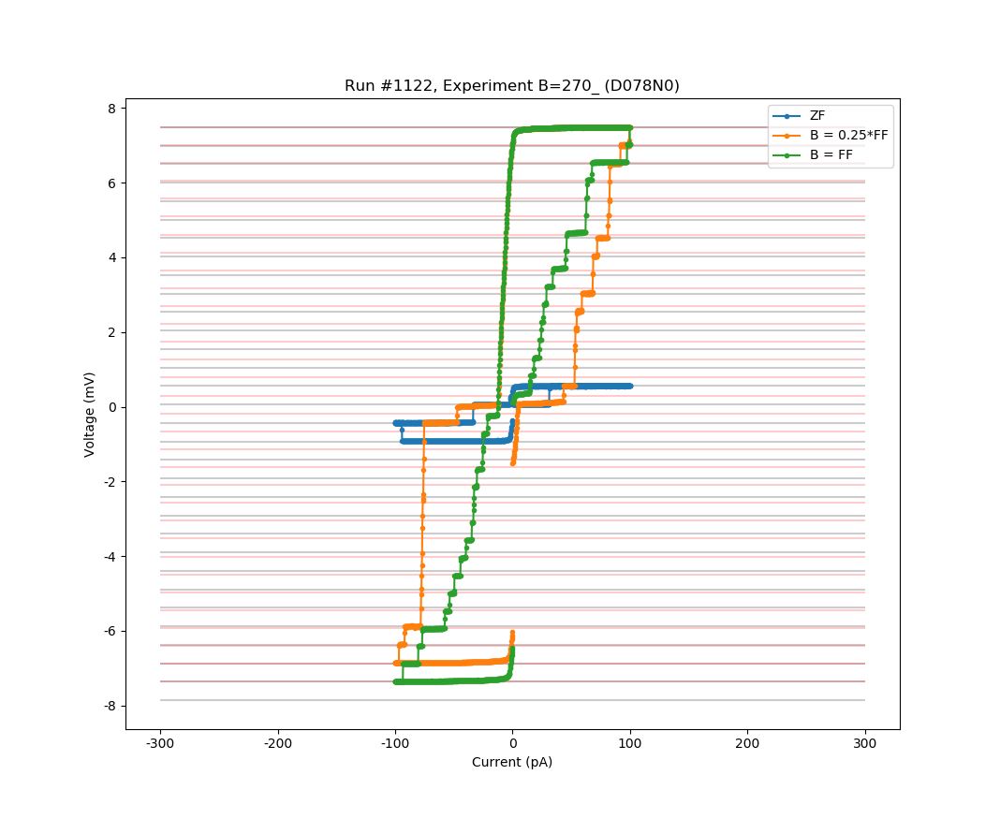

In [53]:
fig, ax = plt.subplots()

labs = 'ZF', 'B = 0.25*FF', 'B = FF'

batch_plot_by_id([ 1118, 1120, 1122], ax = ax, marker = '.' ,ls ='-', 
                 labels = labs)


for i in range(-16,16,1):
    ax.hlines(i*495e-6 +60e-6, -.3e-9,0.3e-9, alpha = 0.2)
    ax.hlines(15*495e-6 +60e-6 - (i+16)*495e-6*30/31, -.3e-9,0.3e-9, alpha = 0.2, color='r')


<IPython.core.display.Javascript object>


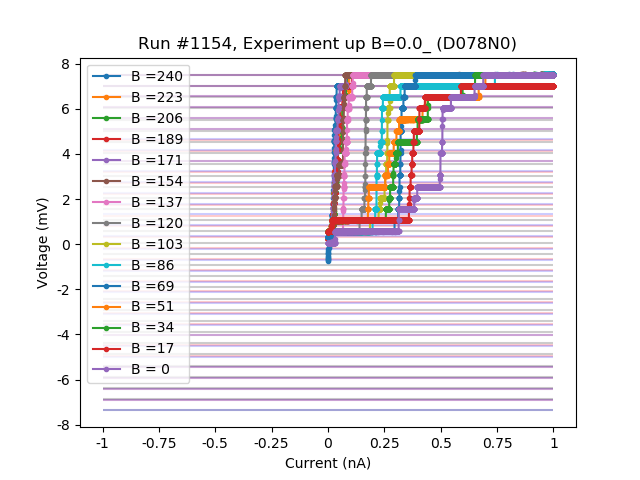

In [197]:
fig, ax = plt.subplots()

Blst = np.linspace(240e-6,0e-6,15)
lbl = ['B ={:2.0f}'.format(B*1e6) for B in Blst]

batch_plot_by_id(range(1140, 1154+1),ax, marker='.', labels = lbl)

gap = 495.5e-6
offset = 68e-6
N = 15

fr = 20e-6

for i in range(-N,N+1,1):
    ax.hlines(i*gap  +offset,                    -1e-9,1e-9, alpha = 0.2)

    ax.hlines( gap*(N*(2*i+1)/(2*N+1)) +offset, -1e-9,1e-9,
                   alpha = 0.2, color='r')

    if i == 0:
        ax.hlines( offset + fr*N, -1e-9,1e-9,
                       alpha = 0.2, color='b')
        ax.hlines( offset - fr*N, -1e-9,1e-9,
                       alpha = 0.2, color='b')
    else:
        k = np.sign(i)*(N - abs(i))
        ax.hlines( offset + gap*i + fr*k, -1e-9,1e-9,
                       alpha = 0.2, color='b')    
    

In [31]:
for i in range(-16,16,1):
    dV = i*1  - (15*1 - (i+16)*1*30/31)
    print(-dV)
    print((15-i)/31)


31.0
1.0
29.032258064516128
0.967741935483871
27.064516129032256
0.9354838709677419
25.096774193548388
0.9032258064516129
23.129032258064516
0.8709677419354839
21.161290322580644
0.8387096774193549
19.193548387096776
0.8064516129032258
17.225806451612904
0.7741935483870968
15.258064516129032
0.7419354838709677
13.290322580645162
0.7096774193548387
11.32258064516129
0.6774193548387096
9.35483870967742
0.6451612903225806
7.387096774193548
0.6129032258064516
5.419354838709678
0.5806451612903226
3.451612903225806
0.5483870967741935
1.483870967741936
0.5161290322580645
-0.48387096774193594
0.4838709677419355
-2.451612903225808
0.45161290322580644
-4.419354838709676
0.41935483870967744
-6.387096774193548
0.3870967741935484
-8.35483870967742
0.3548387096774194
-10.322580645161292
0.3225806451612903
-12.29032258064516
0.2903225806451613
-14.258064516129032
0.25806451612903225
-16.225806451612904
0.22580645161290322
-18.193548387096776
0.1935483870967742
-20.161290322580644
0.16129032258064516


<IPython.core.display.Javascript object>


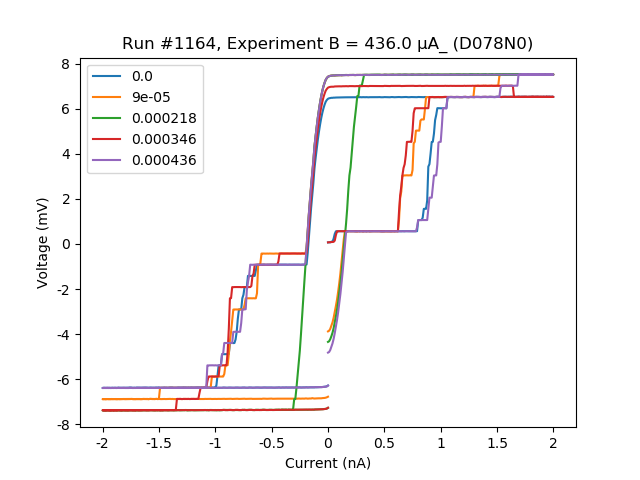

In [64]:
batch_plot_by_id([1160,1161,1162,1166,1164], labels = [0e-6,90e-6,218e-6,346e-6,436e-6])

<IPython.core.display.Javascript object>


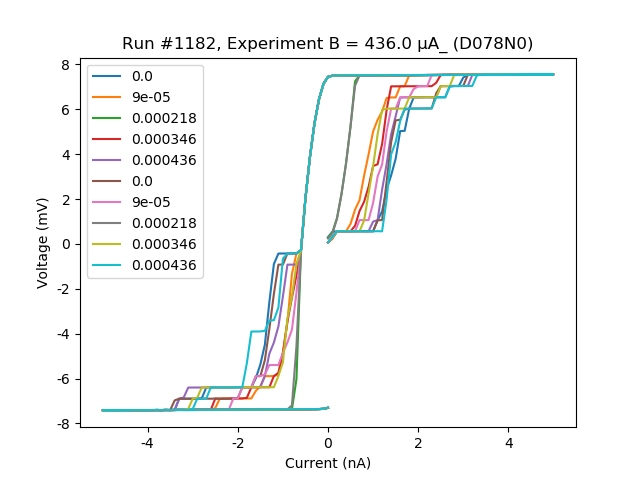

In [71]:
batch_plot_by_id(range(1173,1182+1), labels = [0e-6,90e-6,218e-6,346e-6,436e-6,0e-6,90e-6,218e-6,346e-6,436e-6])

<IPython.core.display.Javascript object>


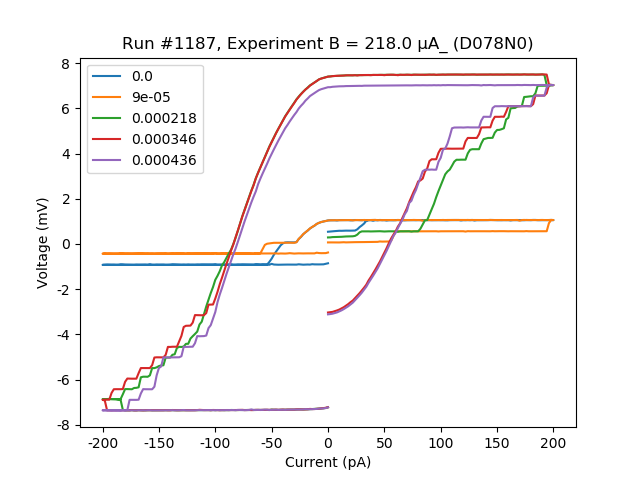

In [75]:
batch_plot_by_id(range(1183,1187+1), 
                 labels = [0e-6,90e-6,218e-6,346e-6,436e-6])

<IPython.core.display.Javascript object>


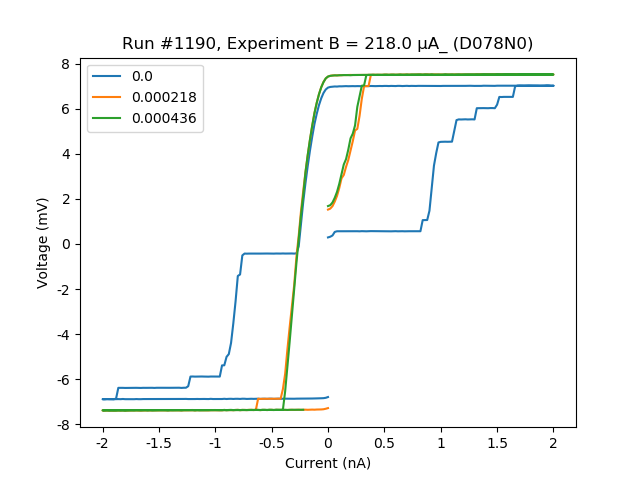

In [78]:
batch_plot_by_id(range(1188,1190+1), 
                 labels = [0e-6,218e-6,436e-6])

<IPython.core.display.Javascript object>


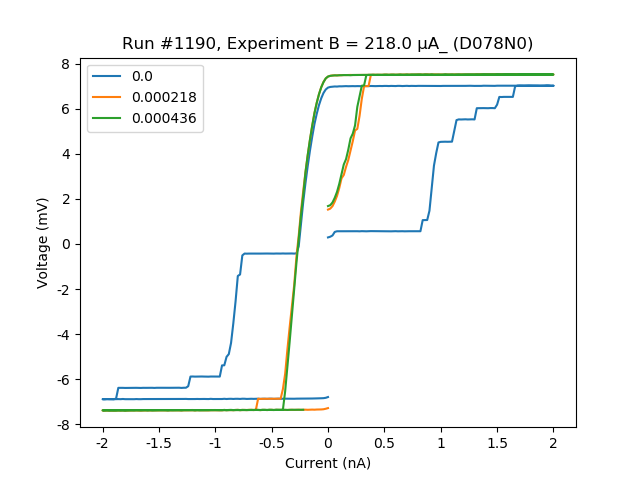

In [78]:
batch_plot_by_id(range(1191,1193+1), 
                 labels = [0e-6,218e-6,436e-6])

<IPython.core.display.Javascript object>


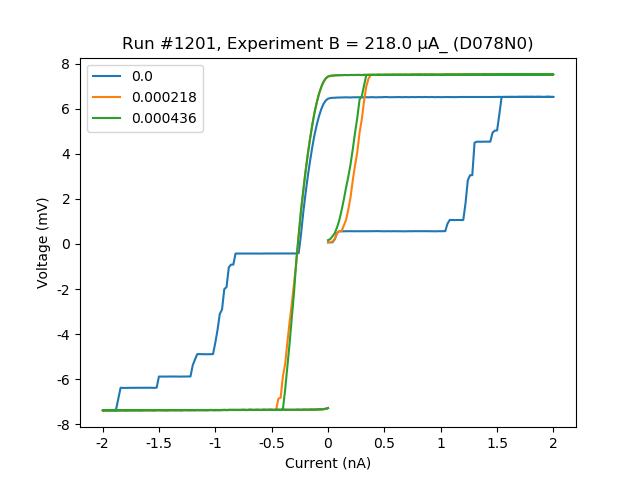

In [83]:
batch_plot_by_id(range(1199,1201+1), 
                 labels = [0e-6,218e-6,436e-6])

Modify stabilize_I(i_stb = 100e-12) to make it more consistent

## 2/1

In [163]:
def findGapOffset (runid = runid):
    Vp = xy_by_id(runid)[1].max()
    Vm = xy_by_id(runid)[1].min()
    N = 16

    gap_all = (Vp-Vm)/2
    offset  = (Vp+Vm)/2
    gap = gap_all/N

    return gap, offset

In [153]:
Vp =  7.5193e-3
Vm = -7.3759e-3
N = 16

gap_all = (Vp-Vm)/2
offset  = (Vp+Vm)/2
gap = gap_all/N


for num in [gap, offset]:
    print(si_format(num))

465.5 µ
71.7 µ


In [184]:
gap = findGapOffset(1215)[0]-40/16*1e-6
offset = findGapOffset(1215)[1]

plt.close('all')
f,ax = plt.subplots()
batch_plot_by_id(exps78N0_pd[exps78N0_pd['T']==150e-3]['ids'].tolist()[0], 
                 labels = [0e-6,145e-6,218e-6],
                 ax = ax, marker = 'x', ls = 'None', alpha = 0.3)
ax.hlines(offset, -3e-9,3e-9, ls = '--')

for i in range(-N,N+1,1):
    if i%2 == 0:
        color = 'r'
    else:
        color = 'b'
    ax.hlines(i*gap  +offset, -3e-9,3e-9, alpha = 0.2, color = color)
plt.show()

<IPython.core.display.Javascript object>

OperationalError: disk I/O error

<IPython.core.display.Javascript object>


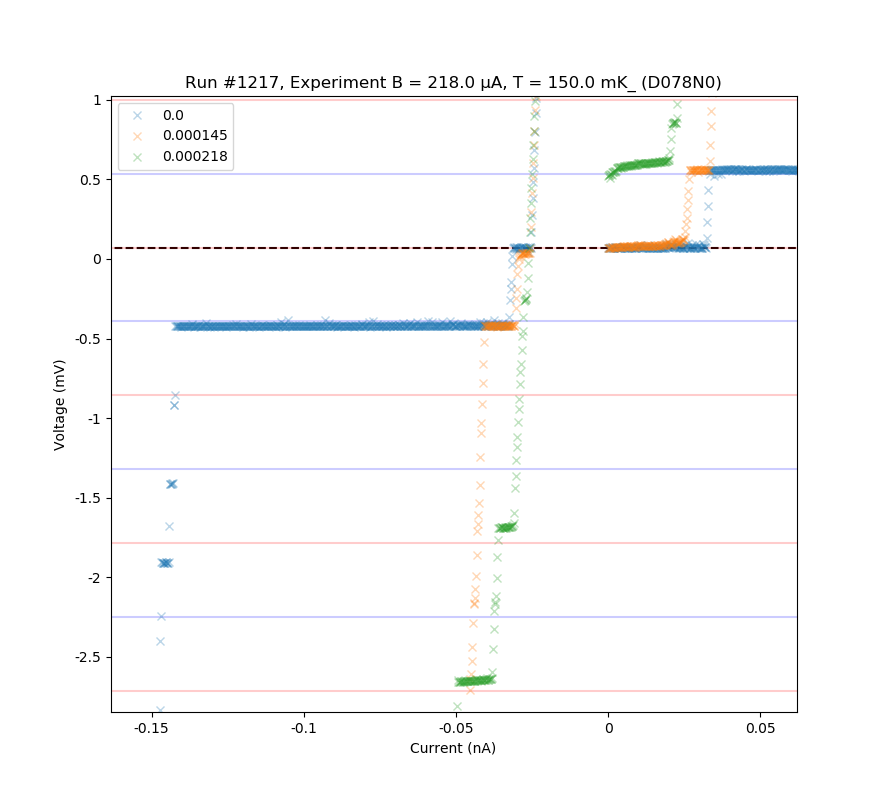

In [181]:
gap = findGapOffset(1215)[0]-40/16*1e-6
offset = findGapOffset(1215)[1]

plt.close('all')
f,ax = plt.subplots()
batch_plot_by_id(exps78N0_pd[exps78N0_pd['T']==150e-3]['ids'].tolist()[0], 
                 labels = [0e-6,145e-6,218e-6],
                 ax = ax, marker = 'x', ls = 'None', alpha = 0.3)
ax.hlines(offset, -3e-9,3e-9, ls = '--')

for i in range(-N,N+1,1):
    if i%2 == 0:
        color = 'r'
    else:
        color = 'b'
    ax.hlines(i*gap  +offset, -3e-9,3e-9, alpha = 0.2, color = color)
plt.show()

<IPython.core.display.Javascript object>


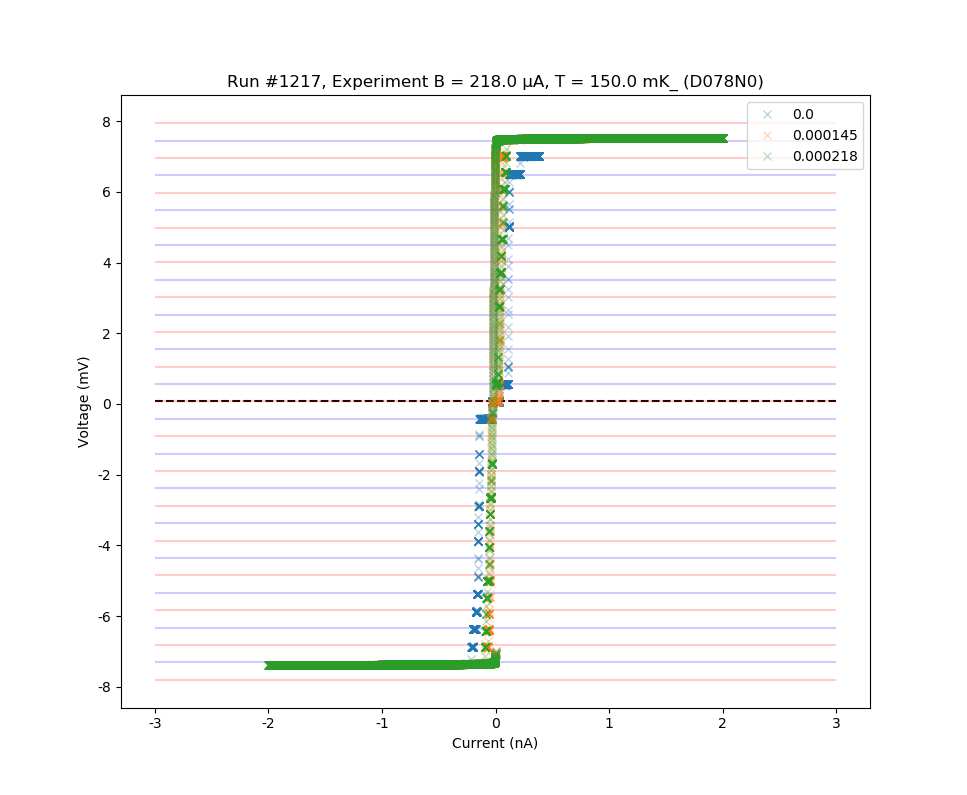

In [180]:
gap = findGapOffset(1215)[0]-40/16*1e-6+28e-6
offset = findGapOffset(1215)[1]

plt.close('all')
f,ax = plt.subplots()
batch_plot_by_id(exps78N0_pd[exps78N0_pd['T']==150e-3]['ids'].tolist()[0], 
                 labels = [0e-6,145e-6,218e-6],
                 ax = ax, marker = 'x', ls = 'None', alpha = 0.3)
ax.hlines(offset, -3e-9,3e-9, ls = '--')

for i in range(-N,N+1,1):
    if i%2 == 0:
        color = 'r'
    else:
        color = 'b'
    ax.hlines(i*gap  +offset, -3e-9,3e-9, alpha = 0.2, color = color)
plt.show()

<IPython.core.display.Javascript object>


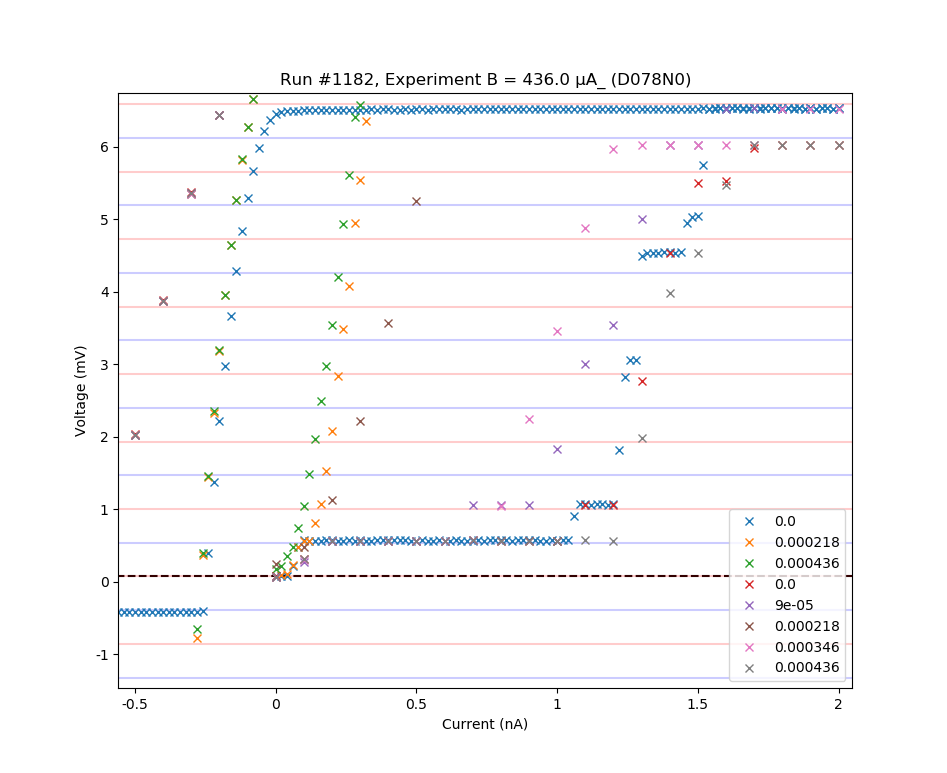

In [121]:
plt.close('all')
f,ax = plt.subplots()
batch_plot_by_id(list(range(1199,1201+1))+list(range(1178,1182+1)), 
                 labels = [0e-6,218e-6,436e-6, 0e-6,90e-6,218e-6,346e-6,436e-6],
                 ax = ax, marker = 'x', ls = 'None')
ax.hlines(offset, -5e-9,5e-9, ls = '--')

for i in range(-N,N+1,1):
    if i%2 == 0:
        color = 'r'
    else:
        color = 'b'
    ax.hlines(i*gap  +offset, -5e-9,5e-9, alpha = 0.2, color = color)
plt.show()

In [123]:
for i in range(-N,N+1,1):

    print(i,N*(2*i+1)/(2*N+1))

-16 -15.030303030303031
-15 -14.06060606060606
-14 -13.090909090909092
-13 -12.121212121212121
-12 -11.151515151515152
-11 -10.181818181818182
-10 -9.212121212121213
-9 -8.242424242424242
-8 -7.2727272727272725
-7 -6.303030303030303
-6 -5.333333333333333
-5 -4.363636363636363
-4 -3.393939393939394
-3 -2.4242424242424243
-2 -1.4545454545454546
-1 -0.48484848484848486
0 0.48484848484848486
1 1.4545454545454546
2 2.4242424242424243
3 3.393939393939394
4 4.363636363636363
5 5.333333333333333
6 6.303030303030303
7 7.2727272727272725
8 8.242424242424242
9 9.212121212121213
10 10.181818181818182
11 11.151515151515152
12 12.121212121212121
13 13.090909090909092
14 14.06060606060606
15 15.030303030303031
16 16.0


In [131]:
Vp =  7.5193e-3
Vm = -7.3759e-3
N = 16

gap_all = (Vp-Vm)/2
offset  = (Vp+Vm)/2
gap = gap_all/N

for num in [gap, offset]:
    print(si_format(num))

465.5 µ
71.7 µ


In [133]:
for i in range(1140, 1141+1):

    Vp = np.max(xy_by_id(i)[1])
    Vm = np.min(xy_by_id(i)[1])
    N = 16
#     gap_all = (Vp-Vm)/2
#     offset  = (Vp+Vm)/2
    gap_all = (Vp-Vm)
    offset  = Vm
    gap = gap_all/(N-1)
    for num in [gap, offset]:
        print(si_format(num))


551.2 µ
-751.2 µ
482.9 µ
273.1 µ


In [ ]:
fig, ax = plt.subplots()

Blst = np.linspace(240e-6,0e-6,15)
lbl = ['B ={:2.0f}'.format(B*1e6) for B in Blst]


for i in range(1140, 1154+1):
    xy_by_id(i)[1]
    
    xy_by_id(i)[0]

    
    ,ax, marker='.', labels = lbl
    
gap = 495.5e-6
offset = 68e-6
N = 16

for i in range(-N,N+1,1):
    ax.hlines( gap*i                   +offset, -1e-9,1e-9, alpha = 0.5, color='C1')
    ax.hlines( gap*(N*(2*i+1)/(2*N+1)) +offset, -1e-9,1e-9, alpha = 0.5, color='C2')

gap = 470e-6
offset = 60e-6
N = 16

for i in range(-N,N+1,1):
    ax.hlines( gap*i                   +offset, -1e-9,1e-9, alpha = 0.5, color='C3')


<IPython.core.display.Javascript object>


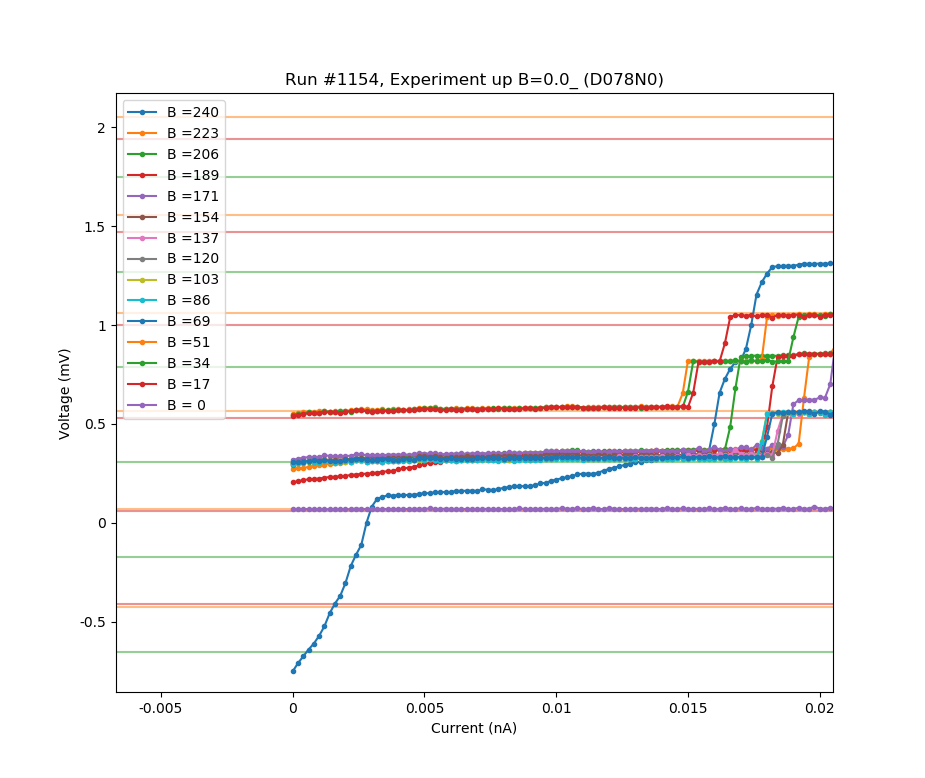

In [130]:
fig, ax = plt.subplots()

Blst = np.linspace(240e-6,0e-6,15)
lbl = ['B ={:2.0f}'.format(B*1e6) for B in Blst]

batch_plot_by_id(range(1140, 1154+1),ax, marker='.', labels = lbl)

gap = 495.5e-6
offset = 68e-6
N = 16

for i in range(-N,N+1,1):
    ax.hlines( gap*i                   +offset, -1e-9,1e-9, alpha = 0.5, color='C1')
    ax.hlines( gap*(N*(2*i+1)/(2*N+1)) +offset, -1e-9,1e-9, alpha = 0.5, color='C2')

gap = 470e-6
offset = 60e-6
N = 16

for i in range(-N,N+1,1):
    ax.hlines( gap*i                   +offset, -1e-9,1e-9, alpha = 0.5, color='C3')


### Fres interpretation

<IPython.core.display.Javascript object>


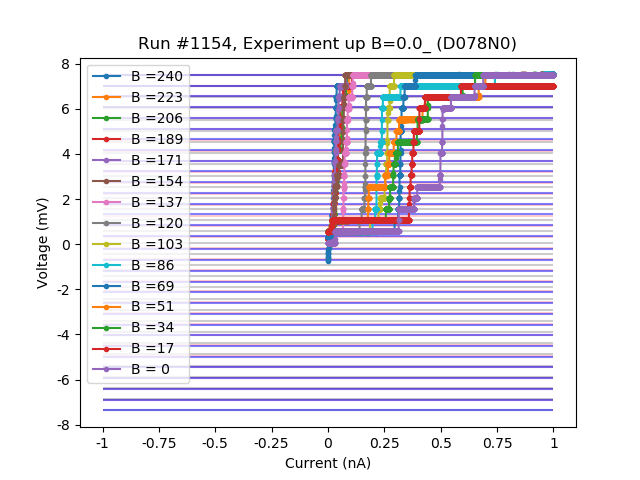

In [198]:
fig, ax = plt.subplots()

Blst = np.linspace(240e-6,0e-6,15)
lbl = ['B ={:2.0f}'.format(B*1e6) for B in Blst]

batch_plot_by_id(range(1140, 1154+1),ax, marker='.', labels = lbl)

gap = 495.5e-6
offset = 68e-6
N = 15

fr = 20e-6

for i in range(-N,N+1,1):
    ax.hlines(i*gap  +offset,                    -1e-9,1e-9, alpha = 0.2)

    ax.hlines( gap*(N*(2*i+1)/(2*N+1)) +offset, -1e-9,1e-9,
                   alpha = 0.2, color='r')

    if i == 0:
        ax.hlines( offset + fr*N, -1e-9,1e-9,
                       alpha = 0.5, color='b')
        ax.hlines( offset - fr*N, -1e-9,1e-9,
                       alpha = 0.5, color='b')
    else:
        k = np.sign(i)*(N - abs(i))
        ax.hlines( offset + gap*i + fr*k, -1e-9,1e-9,
                       alpha = 0.5, color='b')    
    

Wensen was right from the beginning! These are just resonances, with single step size fr = 20 uV. Before any jj switched to gap state (i = 0), the voltage across the single jj is k = N-i times smaller than across the whole chain, so in the meas we observe step at k*fr. Next steps also appear at the distance (N-i)*fr above i-th gap (gray) step. The distance between these resonance steps is Vg-fr
(such steps also 'originate form  (or converge to) N*Vg levels, the only coincidance here (and reason for confusion with division by 31 parts) is that accidentally fr = Vg/(2N+1)

Resonance theory explains why we weren't able to supress all the steps at FF, so probably squids are not too asimmertic


## 2/7

### I_biasing scheme with current devider as attenuation

Following Kostya created the I_attenuation scheme for devie N6 and re-visit chain device N0 with this scheme.

<IPython.core.display.Javascript object>


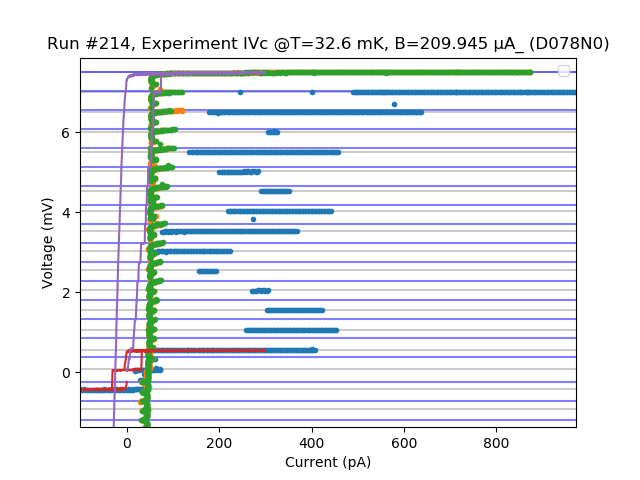

No handles with labels found to put in legend.


In [340]:
f, ax = plt.subplots()

R = 3.2e6
r = 10.1e3

for idx in [1246,1247,1248]:
    I, V = xy_by_id(idx)
    
    V*= -1
    It = (I*r-(V-68e-6))/(r+R)

    ax.plot(It, V+138e-6, marker = '.', ls = '')
batch_plot_by_id([172,214], ax = ax )    
plot_Vg( ax, gap = 495e-6, offset = 68e-6, fr = 20e-6,N = 16)


C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


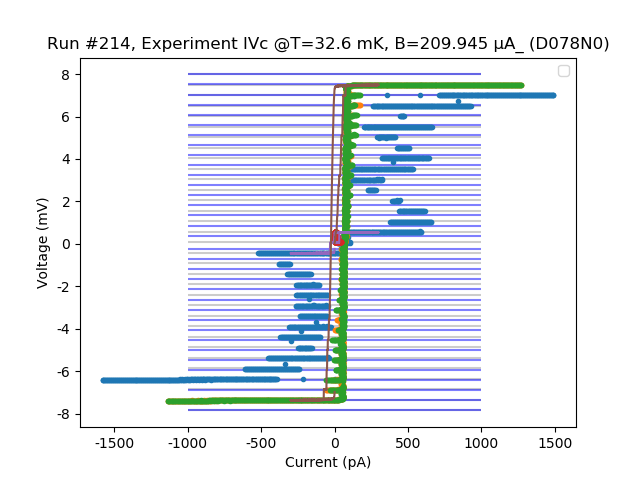

No handles with labels found to put in legend.


In [451]:
f, ax = plt.subplots()

R = 2.2e6
r = 10.1e3

for idx in [1246,1247,1248]:
    I, V = xy_by_id(idx)
    
    V*= -1
    It = (I*r-(V-68e-6))/(r+R)

    ax.plot(It, V+138e-6, marker = '.', ls = '')

for idx in [1253]:
    I, V = xy_by_id(idx)
    It = (I*r-(V-68e-6))/(r+R)    
    ax.plot(It, V, marker = '.', ls = '')
    
    
batch_plot_by_id([172,214], ax = ax )    
plot_Vg( ax, gap = 495e-6, offset = 68e-6, fr = 20e-6,N = 16)


C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


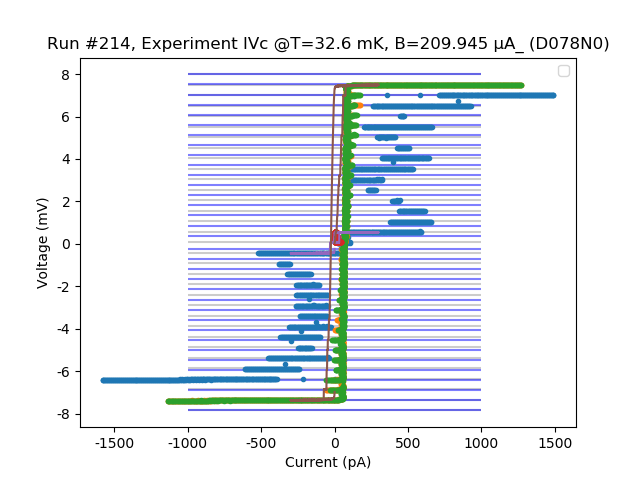

No handles with labels found to put in legend.


In [437]:
f, ax = plt.subplots()

R = 2.2e6
r = 10.1e3

for idx in [1246,1247,1248]:
    I, V = xy_by_id(idx)
    
    V*= -1
    It = (I*r-(V-68e-6))/(r+R)

    ax.plot(It, V+138e-6, marker = '.', ls = '')

for idx in [1253]:
    I, V = xy_by_id(idx)
    It = (I*r-(V-68e-6))/(r+R)    
    ax.plot(It, V, marker = '.', ls = '')
    
    
batch_plot_by_id([172,214], ax = ax )    
plot_Vg( ax, gap = 495e-6, offset = 68e-6, fr = 20e-6,N = 16)


### Sanity check

compare old and new I sw

<IPython.core.display.Javascript object>


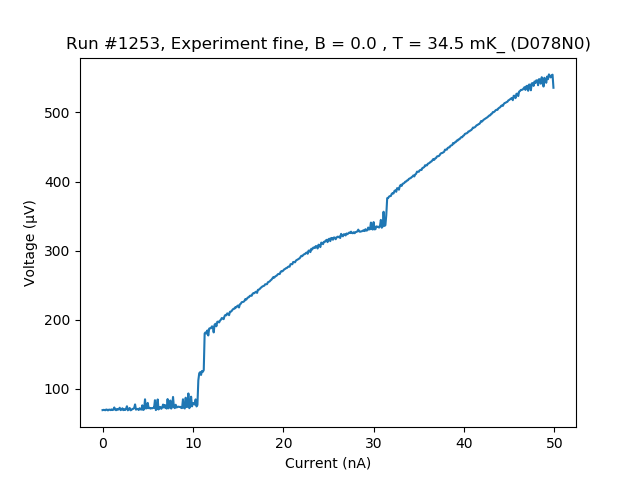

([<matplotlib.axes._subplots.AxesSubplot at 0xbe63cf0>], [None])

In [232]:
plot_by_id (1253)

V across Rload

<IPython.core.display.Javascript object>


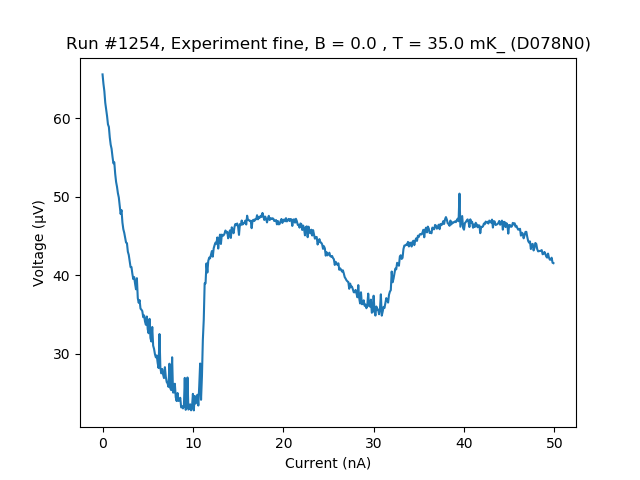

([<matplotlib.axes._subplots.AxesSubplot at 0x1997d670>], [None])

In [264]:
plot_by_id (1254)

<IPython.core.display.Javascript object>


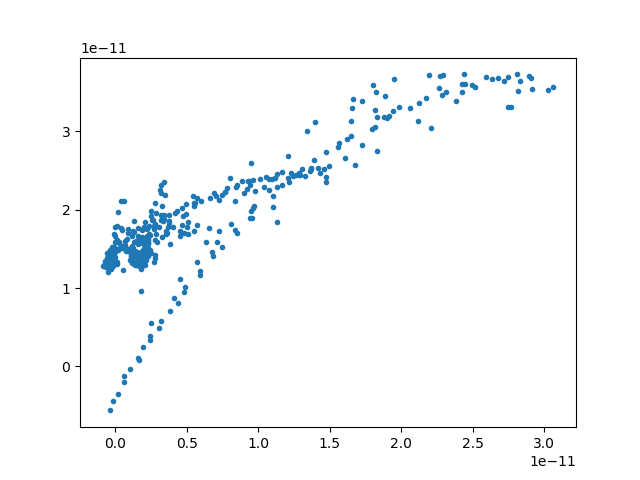

In [263]:
f, ax = plt.subplots()

R = 3.2e6
r = 10.1e3


V_Rload = -1*xy_by_id(1254)[1] + 60e-6 #Rload
Imeas = V_Rload/1e6



Ith_, V = xy_by_id(1253) #jj 
Ith = (Ith_*r-(V-68e-6))/(r+R)


ax.plot(Ith, Imeas, '.')

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


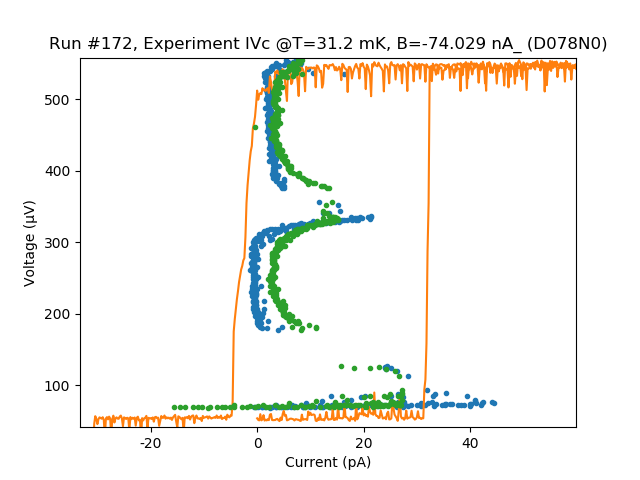

In [450]:
f, ax = plt.subplots()

R = 2.2e6
r = 10.1e3

for idx in [1253]:
    I, V = xy_by_id(idx)
    It = (I*r-(V-68e-6))/(r+R)
    ax.plot(It, V, marker = '.', ls = '')
    
plot_by_id (172, axes = ax)


_, V = xy_by_id(1253)
#     It = (I*r-(V-68e-6))/(r+R)

V_Rload = -1*xy_by_id(1254)[1] + 50e-6
It = V_Rload/1e6
ax.plot(It, V, marker = '.', ls = '')

not exact 1 to 1 correspondance. more fine R_load meas

<IPython.core.display.Javascript object>


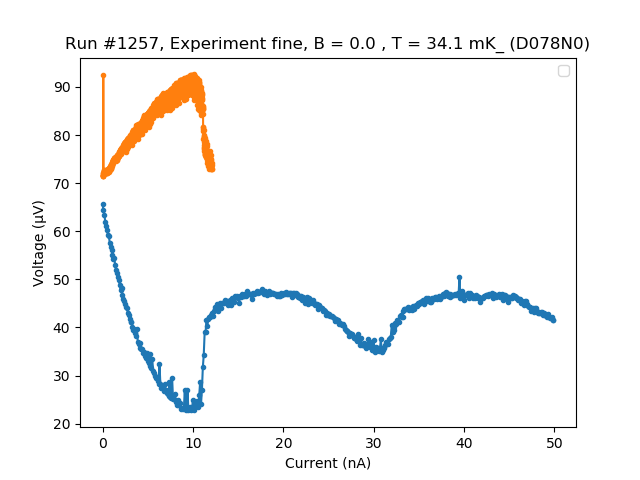

No handles with labels found to put in legend.


In [271]:
    
batch_plot_by_id ([1254,1257], marker =  '.')

Once more time, Rload 1257, jj 1258

Vrload is smaller when measure with more points (larger delay?)

<IPython.core.display.Javascript object>


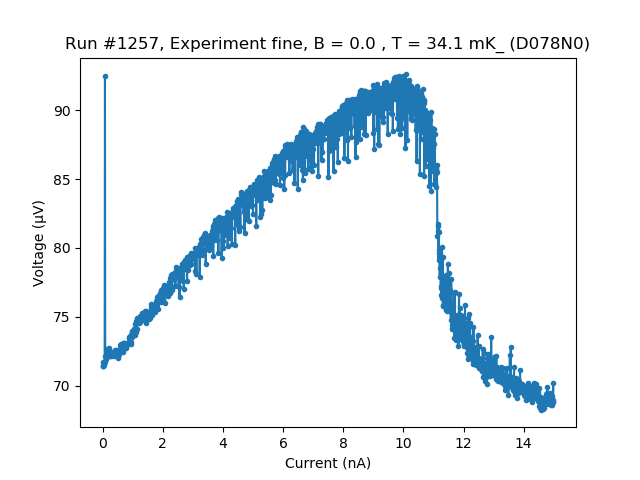

([<matplotlib.axes._subplots.AxesSubplot at 0x1b3b85b0>], [None])

In [277]:
plot_by_id (1257, marker =  '.')

<IPython.core.display.Javascript object>


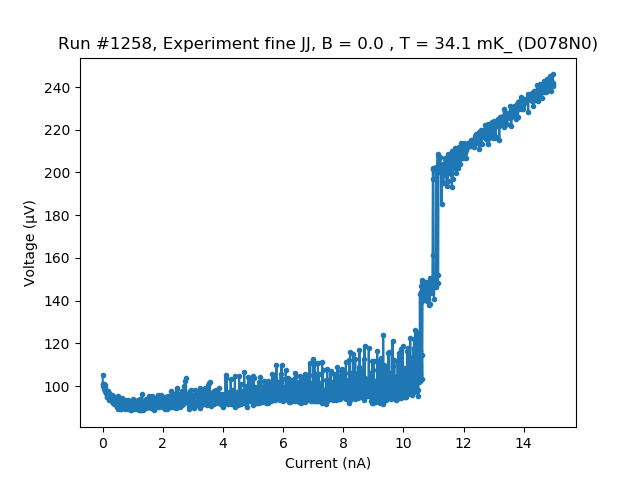

([<matplotlib.axes._subplots.AxesSubplot at 0x1ce0d610>], [None])

In [278]:
plot_by_id (1258, marker =  '.')


C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


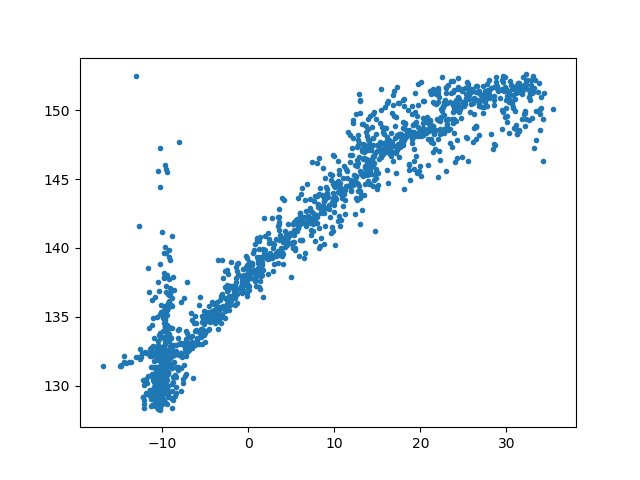

In [449]:
f, ax = plt.subplots()

R = 2.2e6
r = 10.1e3


V_Rload = xy_by_id(1257)[1] + 60e-6 #Rload
Imeas = V_Rload/1e6



Ith_, V = xy_by_id(1258) #jj 
Ith = (Ith_*r-(V-68e-6))/(r+R)


ax.plot(Ith*1e12, Imeas*1e12, '.')

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


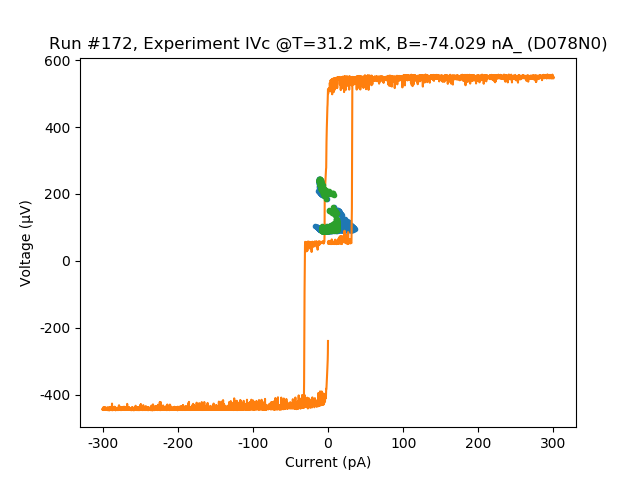

In [461]:
f, ax = plt.subplots()

R = 2.2e6
r = 10.1e3

id_r = 1257
id_j = 1258

for idx in [id_j]:
    I, V = xy_by_id(idx)
    It = (I*r-(V-68e-6))/(r+R)
    ax.plot(It, V, marker = '.', ls = '')
    
plot_by_id (172, axes = ax)


_, V = xy_by_id(id_j)
#     It = (I*r-(V-68e-6))/(r+R)

V_Rload = xy_by_id(id_r)[1] - 80e-6
It = V_Rload/1e6
ax.plot(It, V, marker = '.', ls = '')

check larger step size

<IPython.core.display.Javascript object>


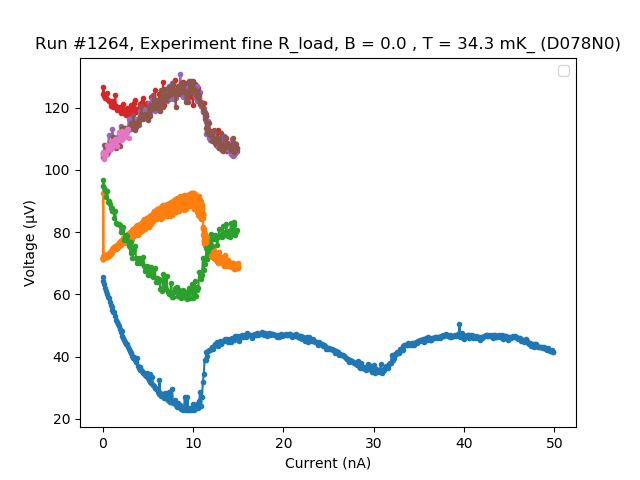

No handles with labels found to put in legend.


In [296]:
   
batch_plot_by_id ([1254,1257,1260,1261, 1262, 1263,1264],
                  marker =  '.')

<IPython.core.display.Javascript object>


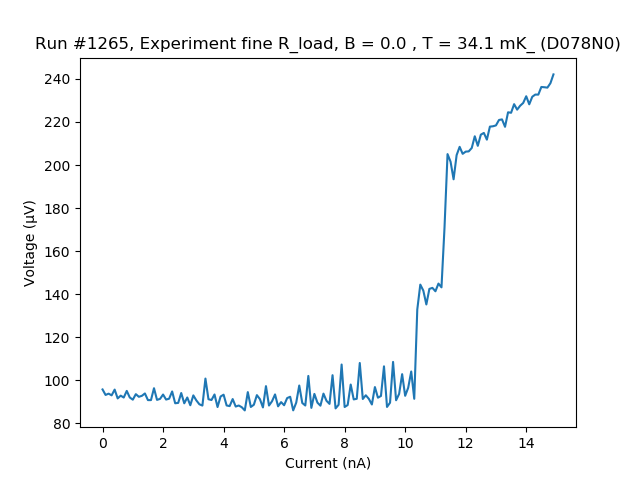

([<matplotlib.axes._subplots.AxesSubplot at 0x212efa90>], [None])

In [299]:
plot_by_id (1265)

## 2/10

### Continue of sanity check

what if we just measure output current of keithley? add 1 MOhm resistor in series with everything

<IPython.core.display.Javascript object>


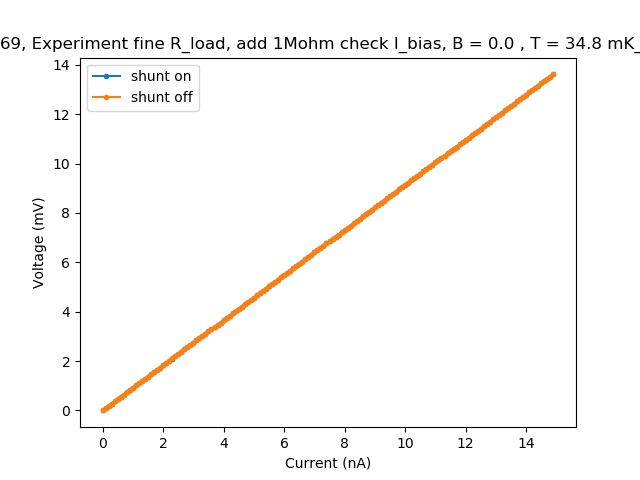

In [304]:
lbl = 'shunt on', 'shunt off'
batch_plot_by_id ([1268, 1269],
                  marker =  '.', labels = lbl)

ok, so the total current running out from KE is as expected regardless of either DUT was shunted or not

<IPython.core.display.Javascript object>


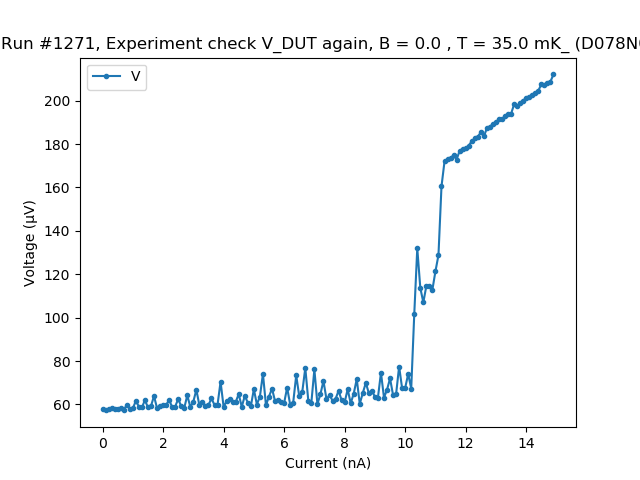

In [307]:
lbl = 'V_DUT'
batch_plot_by_id ([1271],
                  marker =  '.', labels = lbl)

<IPython.core.display.Javascript object>


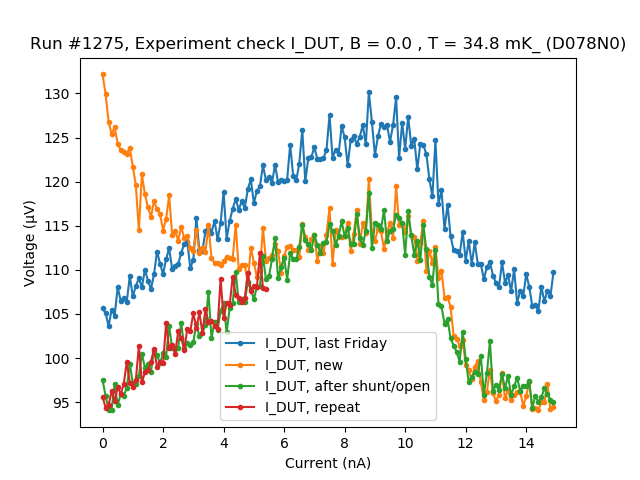

In [316]:
lbl = 'I_DUT, last Friday', 'I_DUT, new', 'I_DUT, after shunt/open', 'I_DUT, repeat'
batch_plot_by_id ([1264,1273,1274,1275],
                  marker =  '.', labels = lbl)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


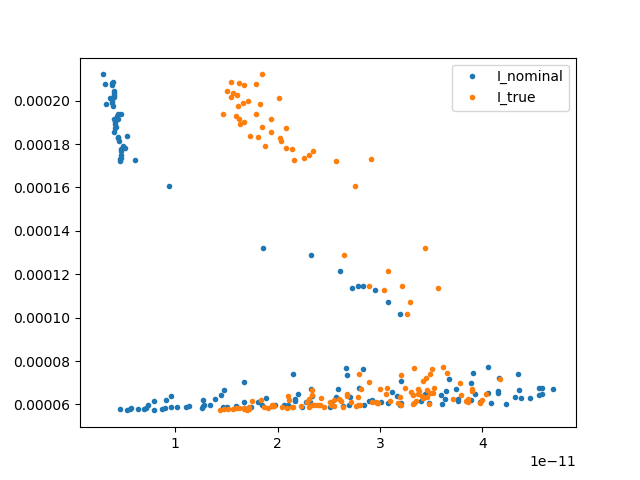

In [444]:
f, ax = plt.subplots()

R = 2.2e6
r = 10.1e3

id_r = 1275
id_j = 1271

for idx in [id_j]:
    I, V = xy_by_id(idx)
    It = (I*r-(V-68e-6))/(r+R)
    ax.plot(It, V, marker = '.', ls = '', label='I_nominal')
    
# plot_by_id (172, axes = ax)


_, V = xy_by_id(id_j)
#     It = (I*r-(V-68e-6))/(r+R)

V_Rload = xy_by_id(id_r)[1] - 80e-6
It = V_Rload/1e6
ax.plot(It, V, marker = '.', ls = '', label='I_true')

ax.legend()

same for udu

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


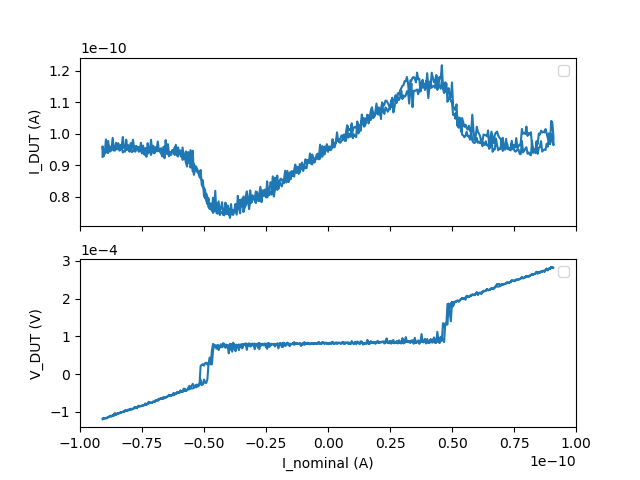

No handles with labels found to put in legend.
No handles with labels found to put in legend.


Text(0.5, 0, 'I_nominal (A)')

In [481]:
f,ax = plt.subplots(2,1,sharex = True)

I,V = xy_by_id (1276)
ax[0].plot(I/220,V/1e6)
ax[0].set_ylabel('I_DUT (A)')

I,V = xy_by_id (1278)
ax[1].plot(I/220,V)
ax[1].set_ylabel('V_DUT (V)')
ax[1].ticklabel_format(axis = 'y',scilimits = (0,3))

ax[1].set_xlim(-1e-10,1e-10)
ax[1].set_xlabel('I_nominal (A)')

# plot_by_id (172, axes=ax)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


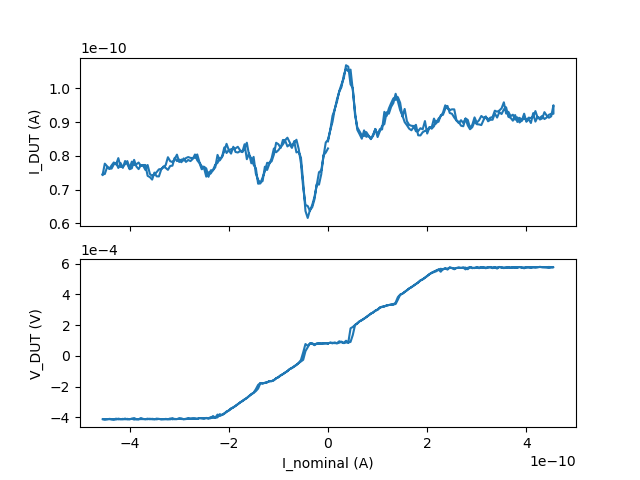

Text(0.5, 0, 'I_nominal (A)')

In [487]:
f,ax = plt.subplots(2,1,sharex = True)

I,V = xy_by_id (1282)
ax[0].plot(I/220,V/1e6)
ax[0].set_ylabel('I_DUT (A)')

I,V = xy_by_id (1279)
ax[1].plot(I/220,V)
ax[1].set_ylabel('V_DUT (V)')
ax[1].ticklabel_format(axis = 'y',scilimits = (0,3))

# ax[1].set_xlim(-1e-10,1e-10)
ax[1].set_xlabel('I_nominal (A)')

# plot_by_id (172, axes=ax)

<IPython.core.display.Javascript object>


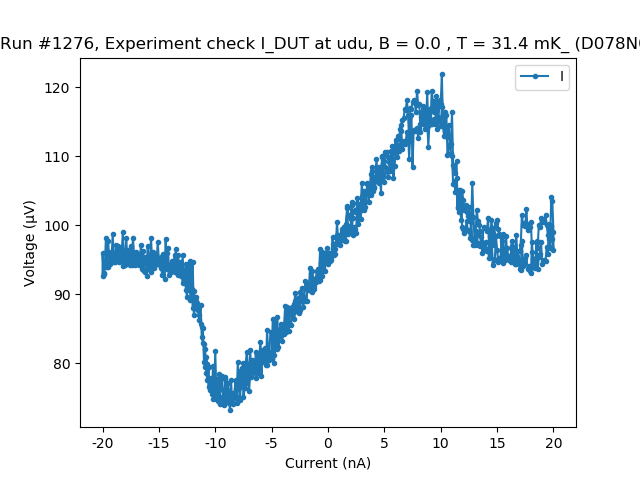

In [326]:
lbl = 'I_DUT'
batch_plot_by_id ([1276],
                  marker =  '.', labels = lbl)

looks like at least it's symmetric

<IPython.core.display.Javascript object>


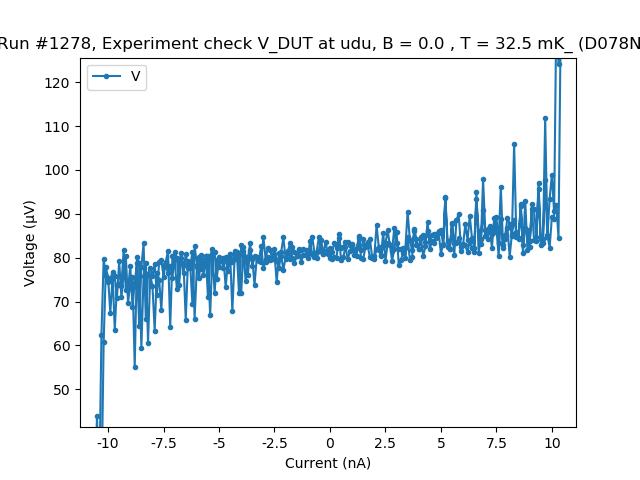

In [329]:
lbl = 'V_DUT'
batch_plot_by_id ([1278],
                  marker =  '.', labels = lbl)

In [ ]:
R = 2.2e6
r = 10.1e3

I_real = (I_nominal * r - (V_DUT-68e-6)) /(r+R)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


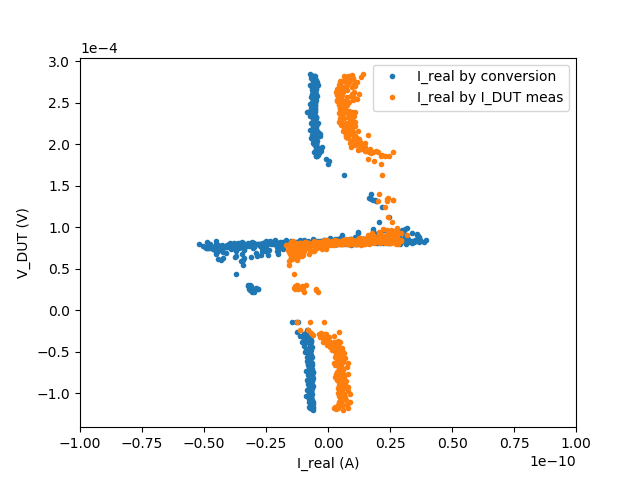

Text(0.5, 0, 'I_real (A)')

In [491]:
f, ax = plt.subplots()

R = 2.2e6
r = 10.1e3

id_r = 1276
id_j = 1278

for idx in [id_j]:
    I, V = xy_by_id(idx)
    It = (I*r-(V-68e-6))/(r+R)
    ax.plot(It, V, marker = '.', ls = '', label='I_real by conversion')
    
# plot_by_id (172, axes = ax)


_, V = xy_by_id(id_j)
#     It = (I*r-(V-68e-6))/(r+R)

V_Rload = xy_by_id(id_r)[1] - 90e-6
It = V_Rload/1e6
ax.plot(It, V, marker = '.', ls = '', label='I_real by I_DUT meas')

ax.legend()

ax.set_xlabel('I_real (A)')
ax.set_ylabel('V_DUT (V)')
ax.ticklabel_format(axis = 'y',scilimits = (0,3))

ax.set_xlim(-1e-10,1e-10)
ax.set_xlabel('I_real (A)')


100nA scan

<IPython.core.display.Javascript object>


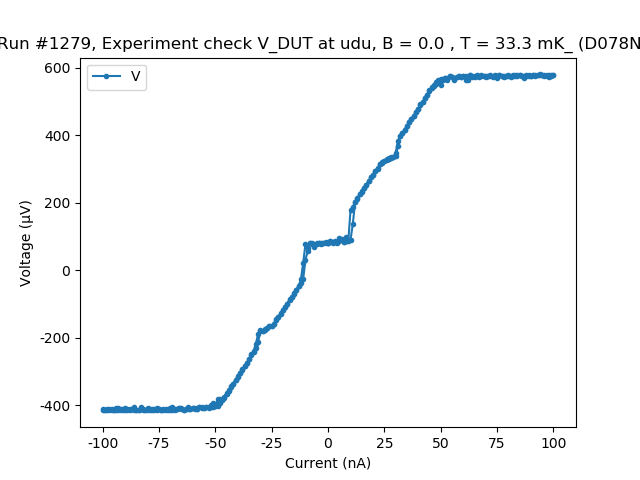

In [333]:
lbl = 'V_DUT'
batch_plot_by_id ([1279],
                  marker =  '.', labels = lbl)

<IPython.core.display.Javascript object>


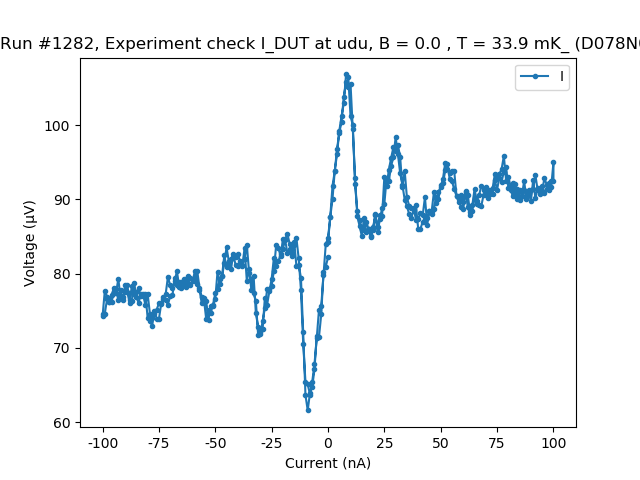

In [337]:
lbl = 'I_DUT'
batch_plot_by_id ([1282],
                  marker =  '.', labels = lbl)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


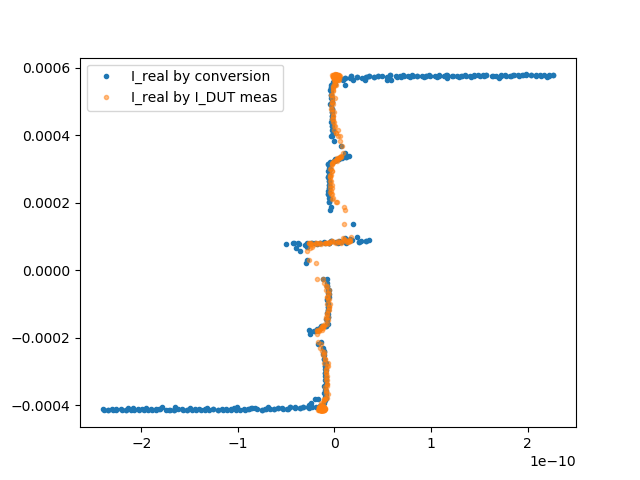

In [492]:
f, ax = plt.subplots()

R = 2.2e6
r = 10.1e3

id_r = 1282
id_j = 1279

for idx in [id_j]:
    I, V = xy_by_id(idx)
    It = (I*r-(V-68e-6))/(r+R)
    ax.plot(It, V, marker = '.', ls = '', label='I_real by conversion')
    
# plot_by_id (172, axes = ax)


_, V = xy_by_id(id_j)
#     It = (I*r-(V-68e-6))/(r+R)

V_Rload = xy_by_id(id_r)[1] - 90e-6
It = V_Rload/1e6
ax.plot(It, V, marker = '.', ls = '', label='I_real by I_DUT meas', alpha = 0.5)

ax.legend()

### Compare with AWG

check KE/AWG performance on +-40pA high resolution again per Misha's request.

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


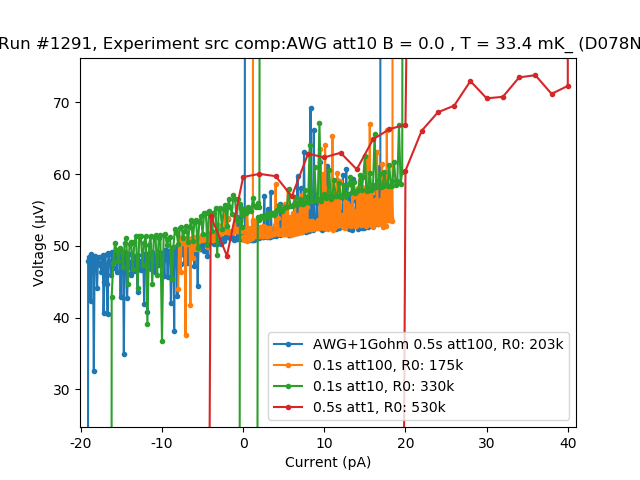

In [500]:
lbl = ['AWG+1Gohm 0.5s att100, R0: 203k', '0.1s att100, R0: 175k', '0.1s att10, R0: 330k', '0.5s att1, R0: 530k']

batch_plot_by_id([1287,1288, 1289, 1291], marker = '.', labels = lbl)

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


<IPython.core.display.Javascript object>


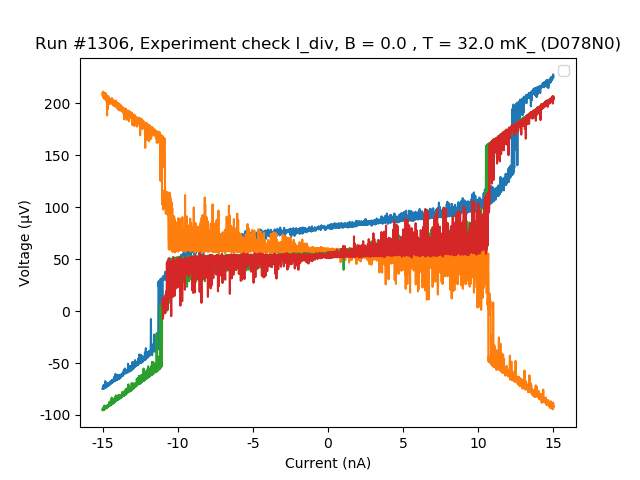

No handles with labels found to put in legend.


In [510]:
batch_plot_by_id([1295,1304,1305,1306])

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


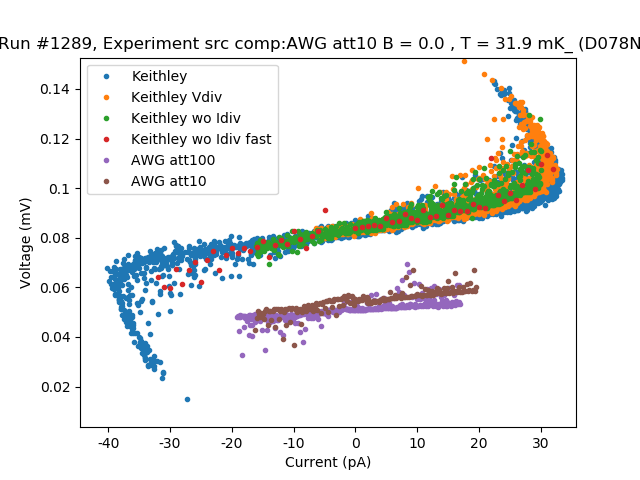

In [501]:
f, ax = plt.subplots()

R = 2.2e6
r = 10.1e3

id_awr = 1287
id_ke = 1295

for idx in [id_ke]:
    I, V = xy_by_id(idx)
    It = (I*r-(V-68e-6))/(r+R)
    ax.plot(It, V, marker = '.', ls = '', label='Keithley')
    

I, V = xy_by_id(1296)
It = (I*r-(V-68e-6))/(r+R)
ax.plot(It, V, marker = '.', ls = '', label='Keithley Vdiv')


plot_by_id(1299, axes = ax, marker = '.',ls = '',  label = 'Keithley wo Idiv')
plot_by_id(1302, axes = ax, marker = '.',ls = '',  label = 'Keithley wo Idiv fast')


plot_by_id(id_awr, axes = ax, marker = '.',ls = '',  label = 'AWG att100')

plot_by_id(1289, axes = ax, marker = '.',ls = '',  label = 'AWG att10')



ax.legend()

C:\Users\KelvinOX25\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """Entry point for launching an IPython kernel.


<IPython.core.display.Javascript object>


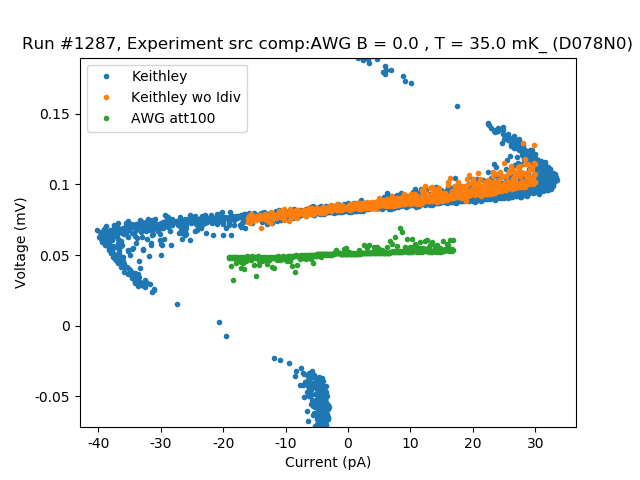

In [502]:
f, ax = plt.subplots()

R = 2.2e6
r = 10.1e3

id_awr = 1287
id_ke = 1295

for idx in [id_ke]:
    I, V = xy_by_id(idx)
    It = (I*r-(V-68e-6))/(r+R)
    ax.plot(It, V, marker = '.', ls = '', label='Keithley')
    

I, V = xy_by_id(1296)
It = (I*r-(V-68e-6))/(r+R)
# ax.plot(It, V, marker = '.', ls = '', label='Keithley Vdiv')


plot_by_id(1299, axes = ax, marker = '.',ls = '',  label = 'Keithley wo Idiv')
# plot_by_id(1302, axes = ax, marker = '.',ls = '',  label = 'Keithley wo Idiv fast')


plot_by_id(id_awr, axes = ax, marker = '.',ls = '',  label = 'AWG att100')





ax.legend()

In [22]:
lbl = ['KE 10kOhm', 'KE 1Mohm' ]

batch_plot_by_id([1295, 1296], marker = '.', labels = lbl)

<IPython.core.display.Javascript object>

# Old codes

#### Constants